# Lab 7- Data Analysis

Exercises 1-4 are to be completed by October 25th. The remaider of the lab is due November 1st. Before leaving lab today, everyone must download the dataset.

## Exercise 1: Reading

### HiggsML
In 2014, some of my colleagues from the ATLAS experiment put together a Higgs Machine Learning Challenge, which was hosted on [Kaggle](https://www.kaggle.com). Please read sections 1 and 3 (skip/skim 2) of [The HiggsML Technical Documentation](https://higgsml.lal.in2p3.fr/files/2014/04/documentation_v1.8.pdf). 

Kaggle is a platform for data science competitions, with cash awards for winners. Kaggle currently hosts over 50,000 public datasets and associated competitions. Later in the course we will look at a variety of problems hosted on Kaggle and similar platforms. 

### SUSY Dataset

For the next few labs we will use datasets used in the [first paper on Deep Learning in High Energy physics](https://arxiv.org/pdf/1402.4735.pdf). Please read up to the "Deep Learning" section (end of page 5). This paper demonstrates that Deep Neural Networks can learn from raw data the features that are typically used by physicists for searches for exotics particles. The authors provide the data they used for this paper. They considered two benchmark scenarios: Higgs and SUSY.

## Exercise 2: Download SUSY Dataset

The information about the dataset can be found at the [UCI Machine Learning Repository](https://archive.ics.uci.edu/ml/index.php). We'll start with the [SUSY Dataset](https://archive.ics.uci.edu/ml/datasets/SUSY). 

### Download
In a terminal, download the data directly from the source and then decompress it. For example:

* To download:
    * On Mac OS: 
    `curl http://archive.ics.uci.edu/ml/machine-learning-databases/00279/SUSY.csv.gz > SUSY.csv.gz`

    * In linux:
    `wget http://archive.ics.uci.edu/ml/machine-learning-databases/00279/SUSY.csv.gz`

* To uncompress:
`gunzip SUSY.csv.gz`

In [3]:
!curl http://archive.ics.uci.edu/ml/machine-learning-databases/00279/SUSY.csv.gz > SUSY.csv.gz

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed

  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 85623    0 85623    0     0  67399      0 --:--:--  0:00:01 --:--:-- 67526
100  309k    0  309k    0     0   153k      0 --:--:--  0:00:02 --:--:--  153k
100 1859k    0 1859k    0     0   611k      0 --:--:--  0:00:03 --:--:--  611k
100 3460k    0 3460k    0     0   854k      0 --:--:--  0:00:04 --:--:--  854k
100 4849k    0 4849k    0     0   956k      0 --:--:--  0:00:05 --:--:--  963k
100 6343k    0 6343k    0     0  1049k      0 --:--:--  0:00:06 --:--:-- 1311k
100 8418k    0 8418k    0     0  1193k      0 --:--:--  0:00:07 --:--:-- 1612k
100 10.1M    0 10.1M    0     0  1292k      0 --:--:--  0:00:08 --:--:-- 1709k
100 12.5M    0 12.5M    0     0  1426k      0 --:--

In [11]:
!del SUSY.csv

In [4]:
!powershell -Command "& 'C:\Program Files\7-Zip\7z.exe' e SUSY.csv.gz"



7-Zip 24.07 (x64) : Copyright (c) 1999-2024 Igor Pavlov : 2024-06-19

Scanning the drive for archives:
1 file, 922377711 bytes (880 MiB)

Extracting archive: SUSY.csv.gz
--
Path = SUSY.csv.gz
Type = gzip
Headers Size = 19

Everything is Ok

Size:       2390277560
Compressed: 922377711


In [5]:
!powershell -Command "Get-ChildItem | Format-Table Name,@{Label='Size(MB)';Expression={[math]::Round($_.Length / 1MB, 2)}}"



Name        Size(MB)
----        --------
Lab.7.ipynb    10.74
Lab.7.pdf       5.83
SUSY.csv     2279.55
SUSY.csv.gz   879.65




The data is provided as a comma separated file.

In [6]:
filename = 'SUSY.csv'
with open(filename, 'r') as file:
    for i in range(5):
        print(file.readline().strip())


0.000000000000000000e+00,9.728614687919616699e-01,6.538545489311218262e-01,1.176224589347839355e+00,1.157156467437744141e+00,-1.739873170852661133e+00,-8.743090629577636719e-01,5.677649974822998047e-01,-1.750000417232513428e-01,8.100607395172119141e-01,-2.525521218776702881e-01,1.921887040138244629e+00,8.896374106407165527e-01,4.107718467712402344e-01,1.145620822906494141e+00,1.932632088661193848e+00,9.944640994071960449e-01,1.367815494537353516e+00,4.071449860930442810e-02
1.000000000000000000e+00,1.667973041534423828e+00,6.419061869382858276e-02,-1.225171446800231934e+00,5.061022043228149414e-01,-3.389389812946319580e-01,1.672542810440063477e+00,3.475464344024658203e+00,-1.219136357307434082e+00,1.295456290245056152e-02,3.775173664093017578e+00,1.045977115631103516e+00,5.680512785911560059e-01,4.819284379482269287e-01,0.000000000000000000e+00,4.484102725982666016e-01,2.053557634353637695e-01,1.321893453598022461e+00,3.775840103626251221e-01
1.000000000000000000e+00,4.4483992457389831

## Reducing the dataset

This is a rather large dataset. If you have trouble loading it, we can easily make a new file with less data.

Here we look at the size of the data

In [7]:
!powershell -Command "Get-ChildItem | Format-Table Name,@{Label='Size(MB)';Expression={[math]::Round($_.Length / 1MB, 2)}}"



Name        Size(MB)
----        --------
Lab.7.ipynb    10.74
Lab.7.pdf       5.83
SUSY.csv     2279.55
SUSY.csv.gz   879.65




We see that we have 5 million datapoints.

In [8]:
!powershell -Command "(Get-Content SUSY.csv | Measure-Object -Line).Lines"

5000000


We create a new file of the first half million. This is sufficient for our needs in this lab:

In [9]:
!powershell -Command "Get-Content SUSY.csv -TotalCount 500000 | Set-Content SUSY-small.csv"

In [10]:
!powershell -Command "Get-ChildItem | Format-Table Name,@{Label='Size(MB)';Expression={[math]::Round($_.Length / 1MB, 2)}}"


Name           Size(MB)
----           --------
Lab.7.ipynb       10.74
Lab.7.pdf          5.83
SUSY-small.csv   228.43
SUSY.csv        2279.55
SUSY.csv.gz      879.65




In [11]:
!powershell -Command "(Get-Content SUSY-small.csv | Measure-Object -Line).Lines"


500000


Use this file for the rest of the lab to make this run faster.

### First Look

Each row represents a LHC collision event. Each column contains some observable from that event. The variable names are ([based on documentation](https://archive.ics.uci.edu/ml/datasets/SUSY)):

In [12]:
VarNames=["signal", "l_1_pT", "l_1_eta","l_1_phi", "l_2_pT", "l_2_eta", "l_2_phi", "MET", "MET_phi", "MET_rel", "axial_MET", "M_R", "M_TR_2", "R", "MT2", "S_R", "M_Delta_R", "dPhi_r_b", "cos_theta_r1"]

Some of these variables represent the "raw" kinematics of the observed final state particles, while others are "features" that are derived from these raw quantities:

In [13]:
RawNames=["l_1_pT", "l_1_eta","l_1_phi", "l_2_pT", "l_2_eta", "l_2_phi", "MET", "MET_phi"]
FeatureNames=list(set(VarNames[1:]).difference(RawNames))

In [20]:
RawNames

['l_1_pT',
 'l_1_eta',
 'l_1_phi',
 'l_2_pT',
 'l_2_eta',
 'l_2_phi',
 'MET',
 'MET_phi']

In [21]:
FeatureNames

['dPhi_r_b',
 'MET_rel',
 'R',
 'MT2',
 'cos_theta_r1',
 'M_R',
 'axial_MET',
 'M_Delta_R',
 'M_TR_2',
 'S_R']

We will use pandas to read in the file, and matplotlib to make plots. The following ensures pandas is installed and sets everything up:

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

Now we can read the data into a pandas dataframe:

In [23]:
filename = "SUSY.csv"
df = pd.read_csv(filename, dtype='float64', names=VarNames)

You can see the data in Jupyter by just evaluateing the dataframe:

In [24]:
df

,signal,l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi,MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
0,0.0,0.972861,0.653855,1.176225,1.157156,-1.739873,-0.874309,0.567765,-0.175000,0.810061,-0.252552,1.921887,0.889637,0.410772,1.145621,1.932632,0.994464,1.367815,0.040714
1,1.0,1.667973,0.064191,-1.225171,0.506102,-0.338939,1.672543,3.475464,-1.219136,0.012955,3.775174,1.045977,0.568051,0.481928,0.000000,0.448410,0.205356,1.321893,0.377584
2,1.0,0.444840,-0.134298,-0.709972,0.451719,-1.613871,-0.768661,1.219918,0.504026,1.831248,-0.431385,0.526283,0.941514,1.587535,2.024308,0.603498,1.562374,1.135454,0.180910
3,1.0,0.381256,-0.976145,0.693152,0.448959,0.891753,-0.677328,2.033060,1.533041,3.046260,-1.005285,0.569386,1.015211,1.582217,1.551914,0.761215,1.715464,1.492257,0.090719
4,1.0,1.309996,-0.690089,-0.676259,1.589283,-0.693326,0.622907,1.087562,-0.381742,0.589204,1.365479,1.179295,0.968218,0.728563,0.000000,1.083158,0.043429,1.154854,0.094859
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4999995,1.0,0.853325,-0.961783,-1.487277,0.678190,0.493580,1.647969,1.843867,0.276954,1.025105,-1.486535,0.892879,1.684429,1.674084,3.366298,1.046707,2.646649,1.389226,0.364599
4999996,0.0,0.951581,0.139370,1.436884,0.880440,-0.351948,-0.740852,0.290863,-0.732360,0.001360,0.257738,0.802871,0.545319,0.602730,0.002998,0.748959,0.401166,0.443471,0.239953
4999997,0.0,0.840389,1.419162,-1.218766,1.195631,1.695645,0.663756,0.490888,-0.509186,0.704289,0.045744,0.825015,0.723530,0.778236,0.752942,0.838953,0.614048,1.210595,0.026692
4999998,1.0,1.784218,-0.833565,-0.560091,0.953342,-0.688969,-1.428233,2.660703,-0.861344,2.116892,2.906151,1.232334,0.952444,0.685846,0.000000,0.781874,0.676003,1.197807,0.093689


The first column stores the "truth" label of whether an event was signal or not. Pandas makes it easy to create dataframes that store only the signal or background events:

In [25]:
df_sig=df[df.signal==1]
df_bkg=df[df.signal==0]

The following example plots the signal and background distributions of every variable. Note that we use VarNames[1:] to skip the first variable, which was the true label.

l_1_pT


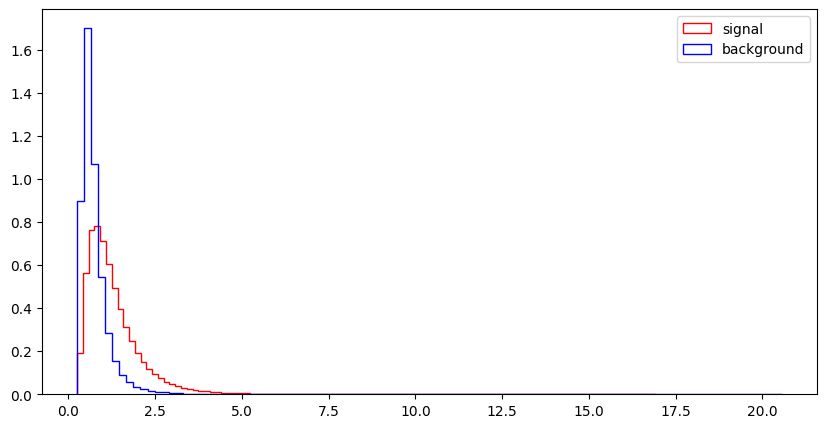

l_1_eta


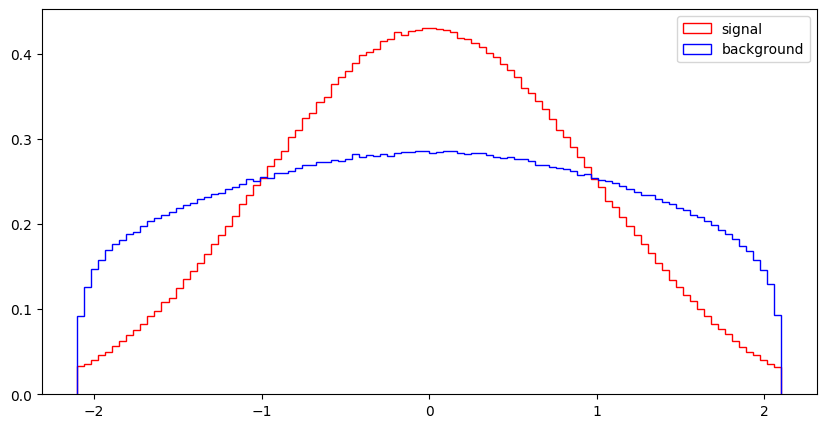

l_1_phi


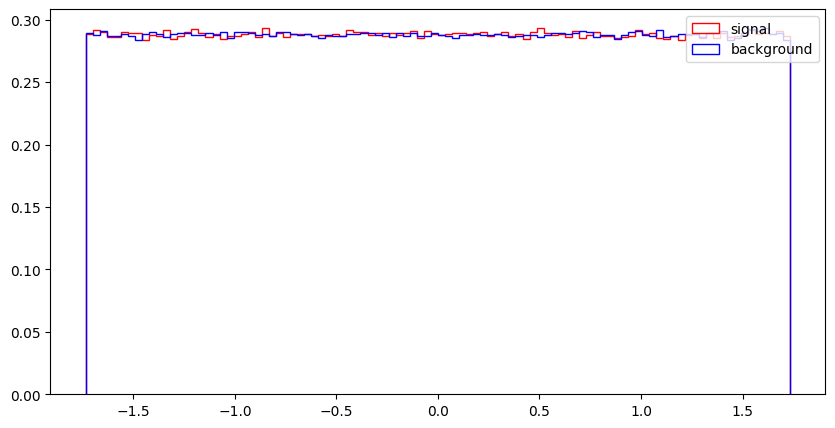

l_2_pT


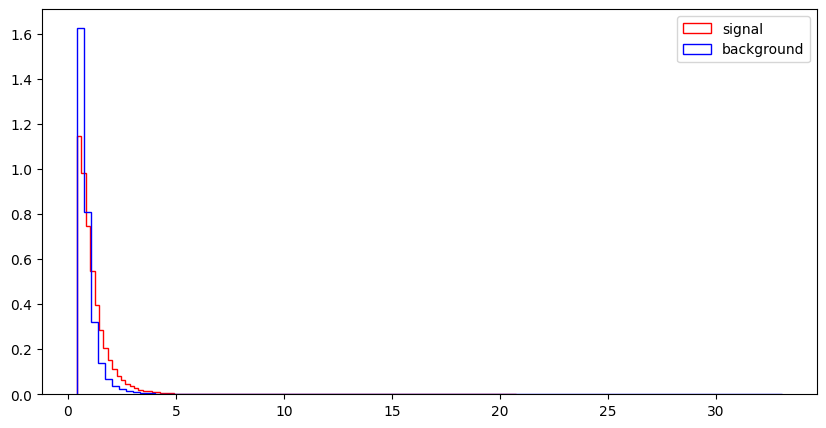

l_2_eta


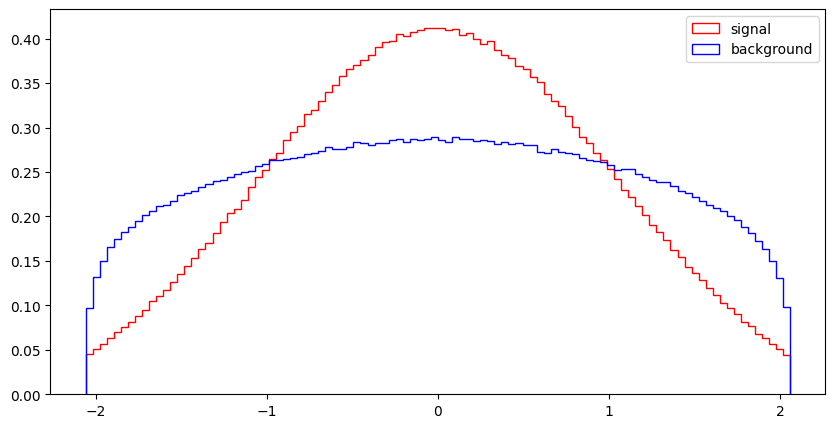

l_2_phi


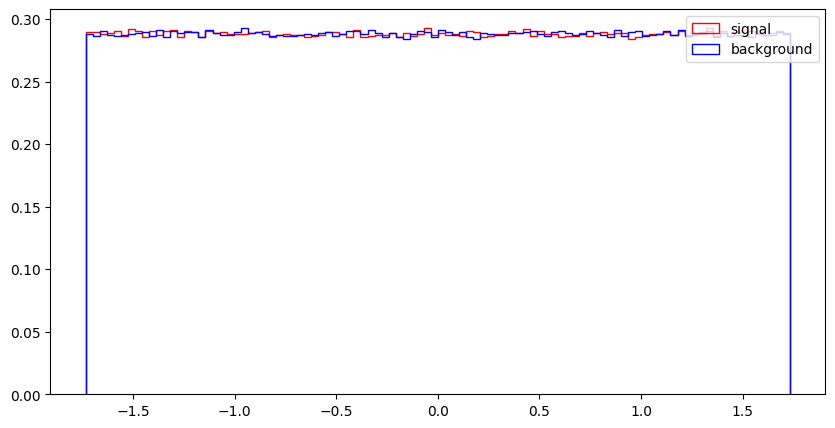

MET


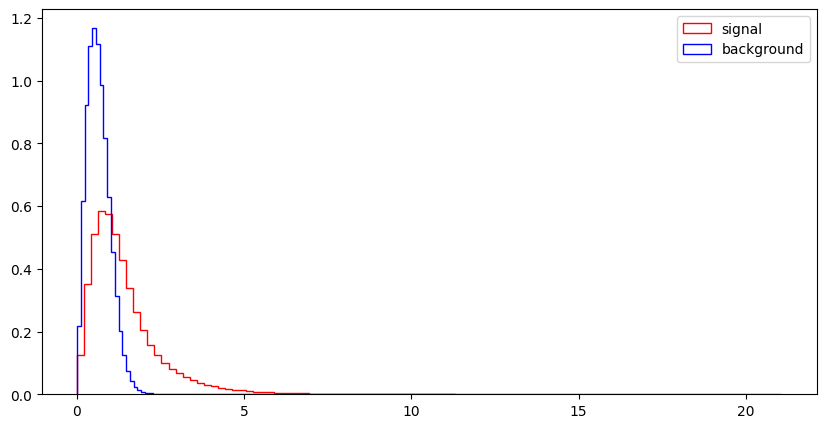

MET_phi


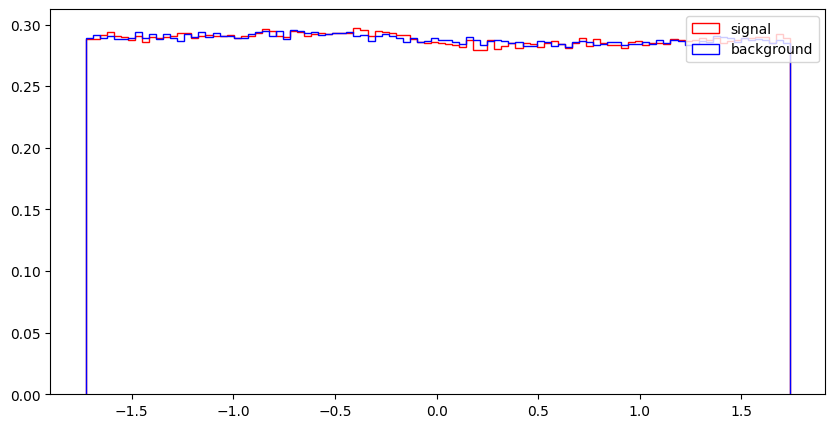

MET_rel


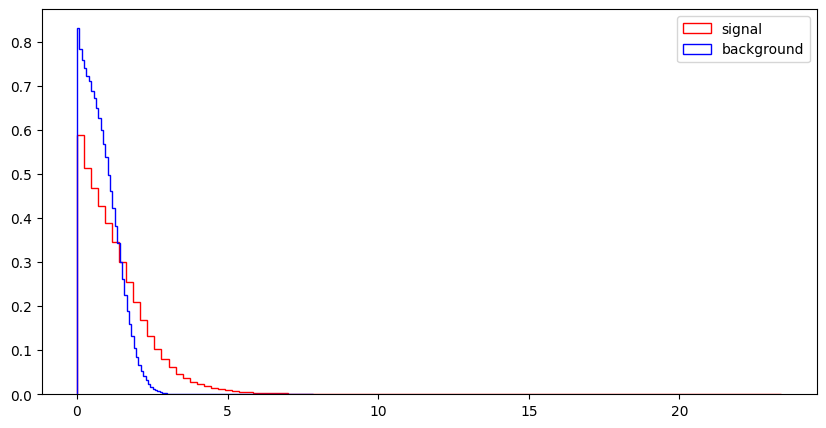

axial_MET


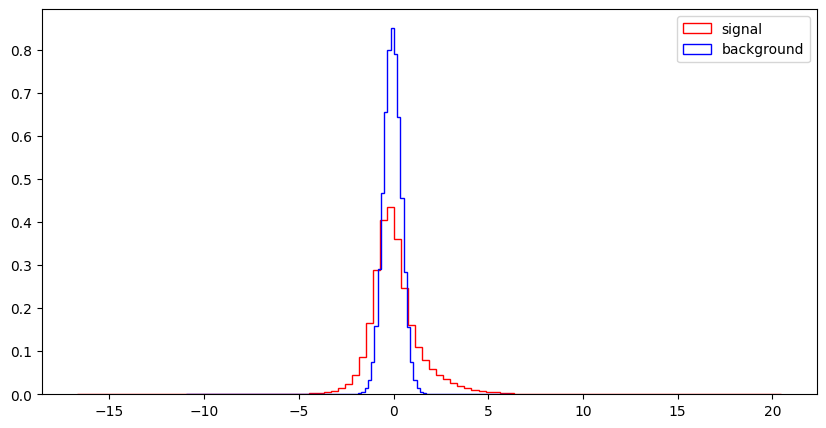

M_R


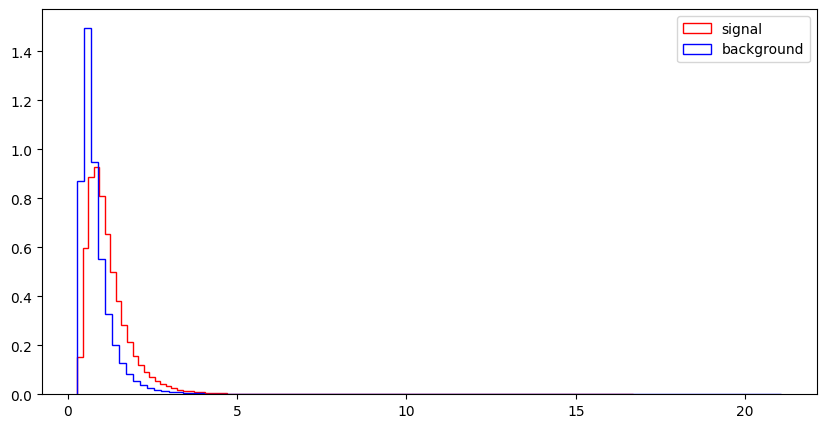

M_TR_2


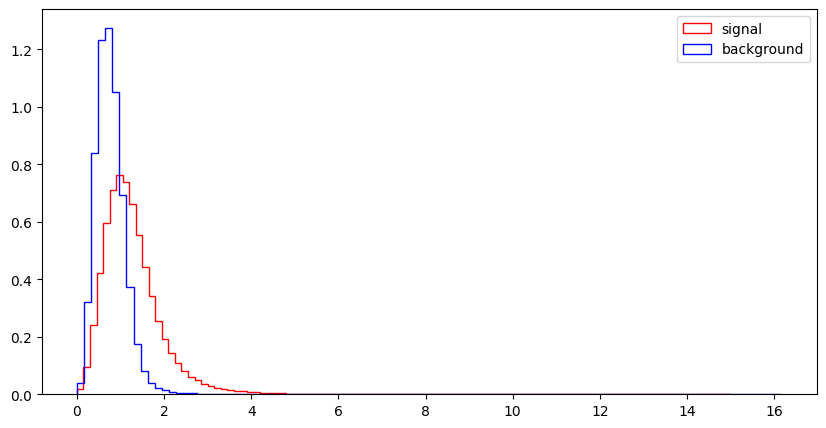

R


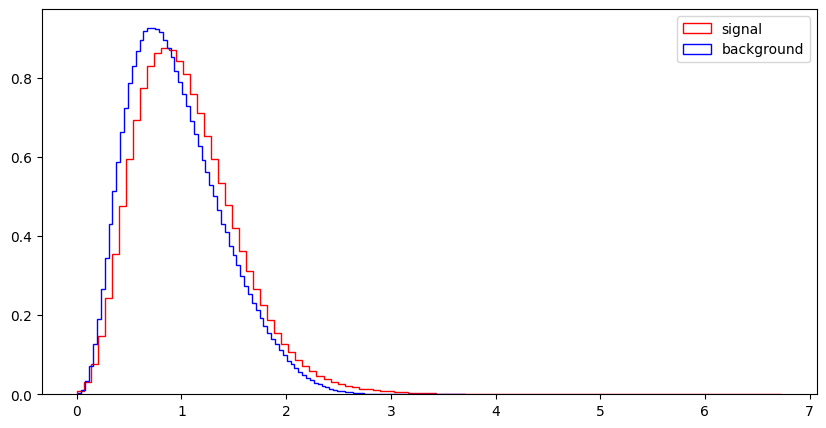

MT2


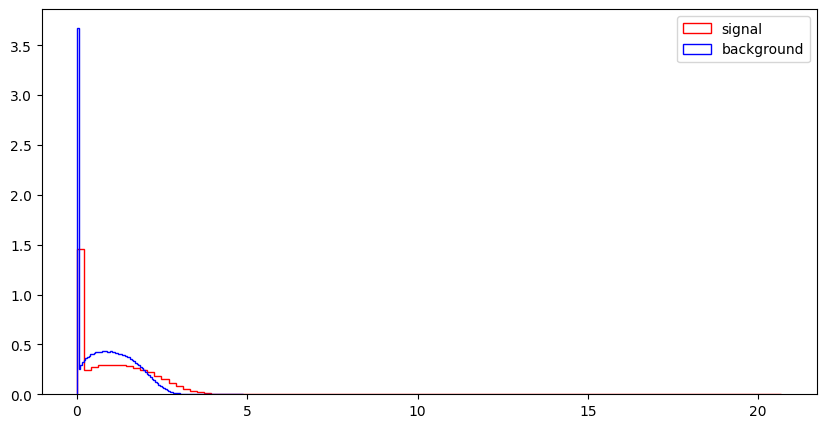

S_R


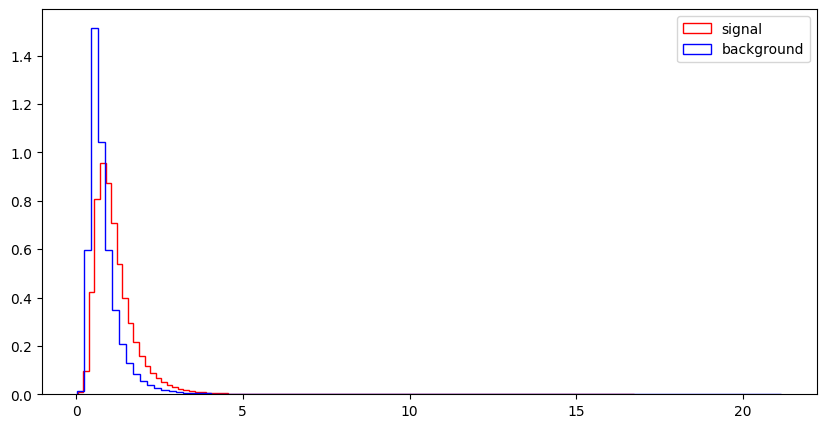

M_Delta_R


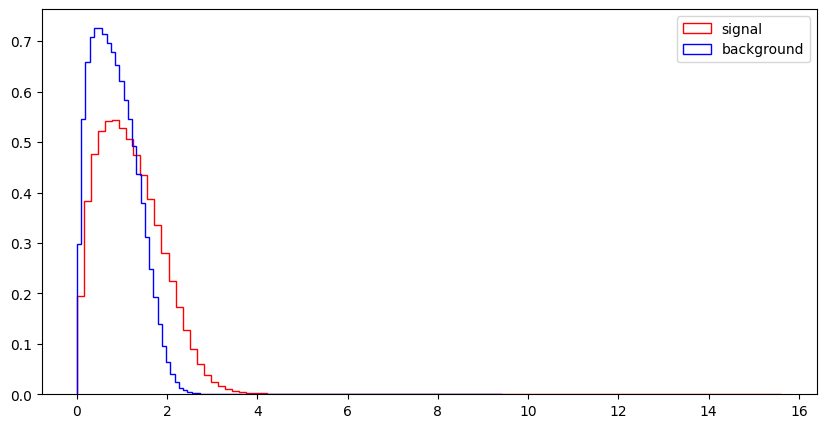

dPhi_r_b


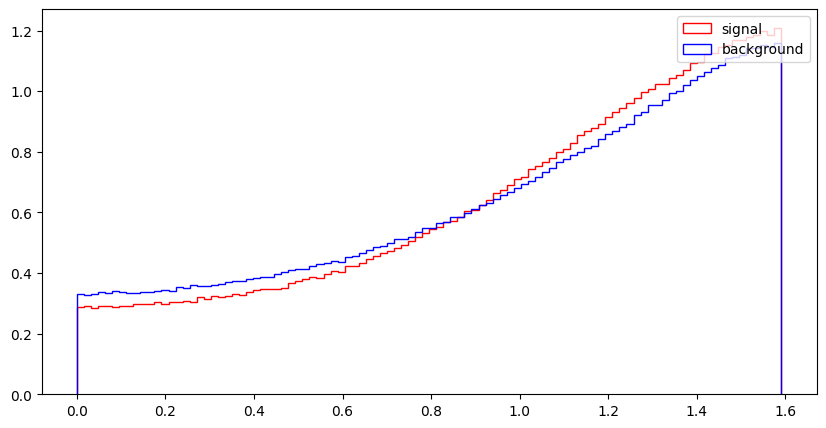

cos_theta_r1


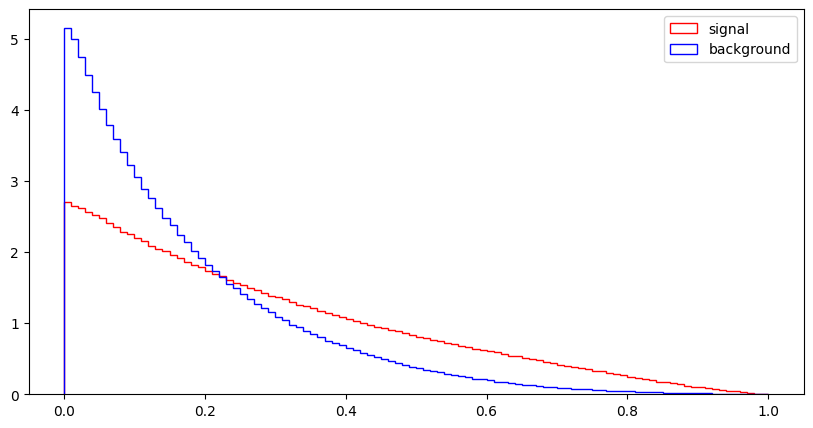

In [26]:
import numpy as np
for var in VarNames[1:]:
    print (var)
    plt.figure(figsize=(10,5))
    plt.hist(np.array(df_sig[var]),bins=100,histtype="step", color="red",label="signal",density=1, stacked=True)
    plt.hist(np.array(df_bkg[var]),bins=100,histtype="step", color="blue", label="background",density=1, stacked=True)
    plt.legend(loc='upper right')
    plt.show()

## Exercise 3: Make nice figures

Now use `matplotlib` to reproduce as closely as you can figures 5 and 6 from the paper. This exercise is intended to get you to familiarize yourself with making nicely formatted `matplotlib` figures with multiple plots. Note that the plots in the paper are actually wrong!

In [27]:
import pandas as pd

# Load the SUSY dataset
data = pd.read_csv('SUSY-small.csv', header=None)


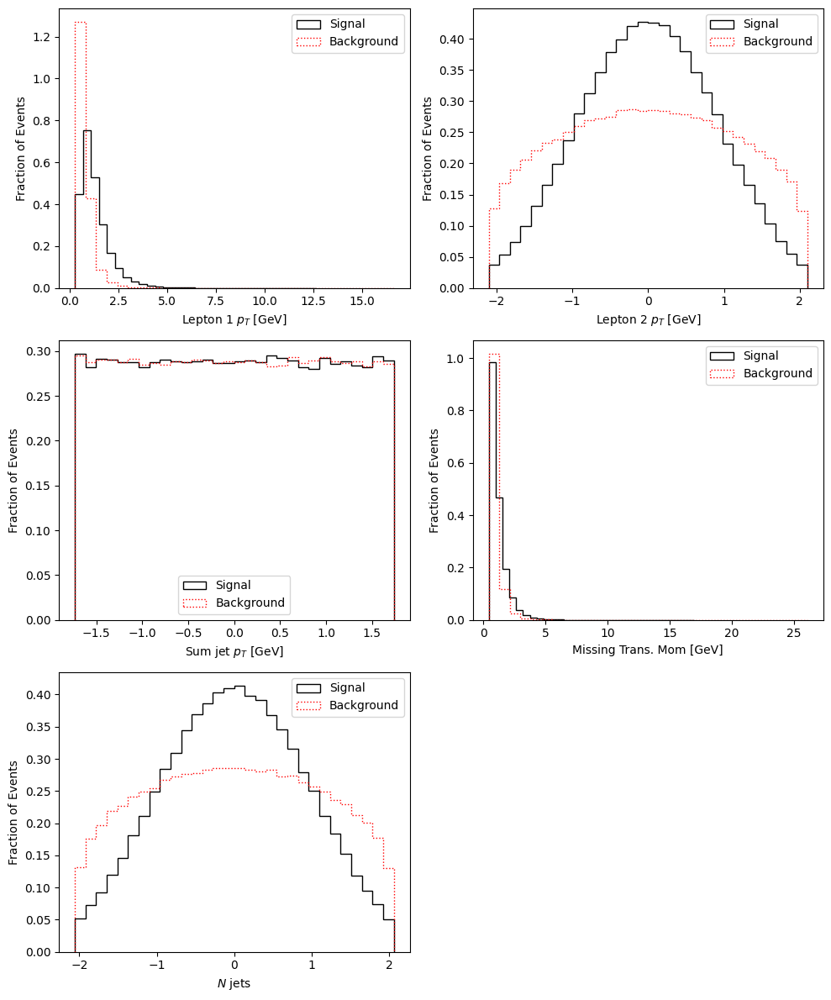

In [28]:
import matplotlib.pyplot as plt
import numpy as np

# Separate signal and background
signal = data[data[0] == 1]
background = data[data[0] == 0]

features = [
    ("Lepton 1 $p_T$ [GeV]", 1),
    ("Lepton 2 $p_T$ [GeV]", 2),
    ("Sum jet $p_T$ [GeV]", 3),
    ("Missing Trans. Mom [GeV]", 4),
    ("$N$ jets", 5)
]

fig, axs = plt.subplots(3, 2, figsize=(10, 12))
axs = axs.ravel()

# Plot each feature
for i, (title, col) in enumerate(features):
    # Plot signal
    axs[i].hist(signal[col], bins=30, density=True, histtype='step', color='black', label='Signal')
    
    # Plot background
    axs[i].hist(background[col], bins=30, density=True, histtype='step', color='red', linestyle='dotted', label='Background')
    
    # Set labels and title
    axs[i].set_xlabel(title)
    axs[i].set_ylabel('Fraction of Events')
    axs[i].legend()

# Hide the last empty subplot
axs[-1].axis('off')

plt.tight_layout()
plt.show()


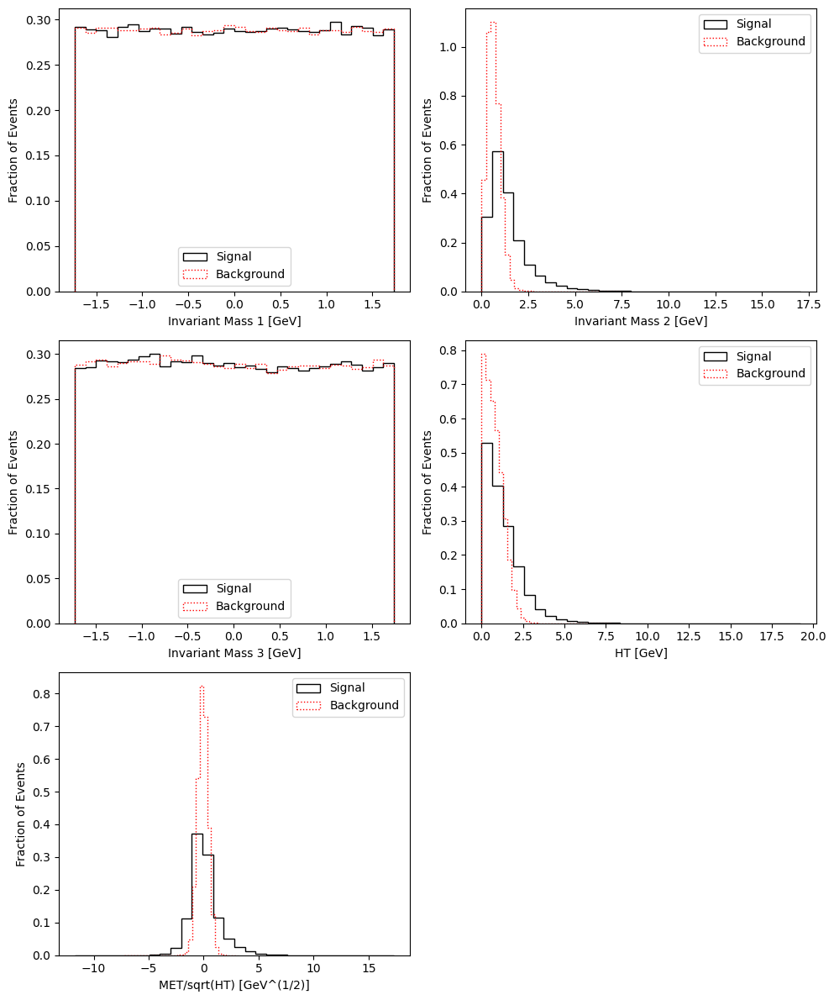

In [29]:
# Separate signal and background
signal = data[data[0] == 1]
background = data[data[0] == 0]

# High-level features from the dataset
features = [
    ("Invariant Mass 1 [GeV]", 6),
    ("Invariant Mass 2 [GeV]", 7),
    ("Invariant Mass 3 [GeV]", 8),
    ("HT [GeV]", 9),
    ("MET/sqrt(HT) [GeV^(1/2)]", 10)
]

fig, axs = plt.subplots(3, 2, figsize=(10, 12))
axs = axs.ravel()

# Plot each feature
for i, (title, col) in enumerate(features):
    # Plot signal
    axs[i].hist(signal[col], bins=30, density=True, histtype='step', color='black', label='Signal')
    
    # Plot background
    axs[i].hist(background[col], bins=30, density=True, histtype='step', color='red', linestyle='dotted', label='Background')
    
    # Set labels and title
    axs[i].set_xlabel(title)
    axs[i].set_ylabel('Fraction of Events')
    axs[i].legend()

# Hide the last empty subplot
axs[-1].axis('off')

plt.tight_layout()
plt.show()


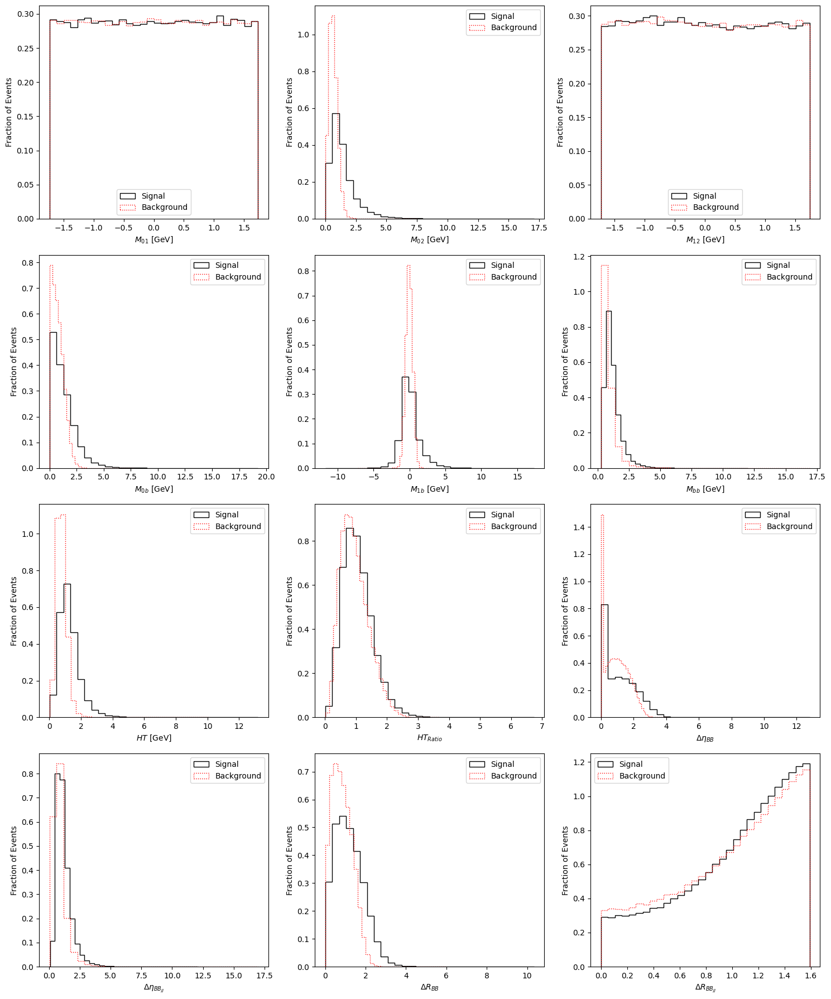

In [30]:
# Separate signal and background
signal = data[data[0] == 1]
background = data[data[0] == 0]

# High-level features from the dataset
features = [
    ("$M_{01}$ [GeV]", 6),
    ("$M_{02}$ [GeV]", 7),
    ("$M_{12}$ [GeV]", 8),
    ("$M_{0b}$ [GeV]", 9),
    ("$M_{1b}$ [GeV]", 10),
    ("$M_{bb}$ [GeV]", 11),
    ("$HT$ [GeV]", 12),
    ("$HT_{Ratio}$", 13),
    ("$\\Delta\\eta_{BB}$", 14),
    ("$\\Delta\\eta_{BB_{JJ}}$", 15),
    ("$\\Delta R_{BB}$", 16),
    ("$\\Delta R_{BB_{JJ}}$", 17)
]

fig, axs = plt.subplots(4, 3, figsize=(15, 18))
axs = axs.ravel()

# Plot each feature
for i, (title, col) in enumerate(features):
    # Plot signal
    axs[i].hist(signal[col], bins=30, density=True, histtype='step', color='black', label='Signal')
    
    # Plot background
    axs[i].hist(background[col], bins=30, density=True, histtype='step', color='red', linestyle='dotted', label='Background')
    
    # Set labels and title
    axs[i].set_xlabel(title)
    axs[i].set_ylabel('Fraction of Events')
    axs[i].legend()

plt.tight_layout()
plt.show()


## Exercise 4: Correlation

### Exercise 4.1

#### Part a
Write a function that creates pair plots and use it to compare variables in the SUSY sample, separately for low and high-level features. Refer to Lecture 13 for details. Do not use `seaborn`.

#### Part b
Making these plots can be slow because creating each plot initiates a full loop over the data. Make at least one modification to your function in part a to speed it up. Can you propose a different method of creating histograms that would speed up making such pair plots?

#### Part c
Which observables appear to be best for separating signal from background?

In [33]:
# Load the dataset with specified headers
VarNames = ["signal", "l_1_pT", "l_1_eta", "l_1_phi", "l_2_pT", "l_2_eta", "l_2_phi", "MET", "MET_phi", 
            "MET_rel", "axial_MET", "M_R", "M_TR_2", "R", "MT2", "S_R", "M_Delta_R", "dPhi_r_b", "cos_theta_r1"]

data = pd.read_csv('SUSY-small.csv', header=None, names=VarNames)

# Now you can proceed with separating low- and high-level features
low_level_features = data[RawNames]
high_level_features = data[FeatureNames]


In [34]:
# Define RawNames and FeatureNames as provided
RawNames = ["l_1_pT", "l_1_eta", "l_1_phi", "l_2_pT", "l_2_eta", "l_2_phi", "MET", "MET_phi"]
FeatureNames = ["MET_rel", "axial_MET", "M_R", "M_TR_2", "R", "MT2", "S_R", "M_Delta_R", "dPhi_r_b", "cos_theta_r1"]

# Separate features into low- and high-level
low_level_features = data[RawNames]
high_level_features = data[FeatureNames]


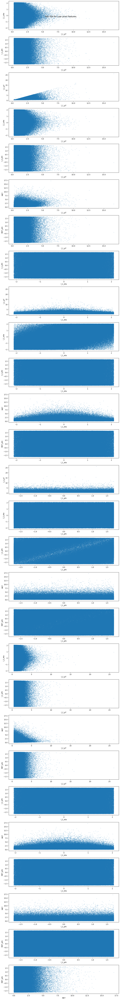

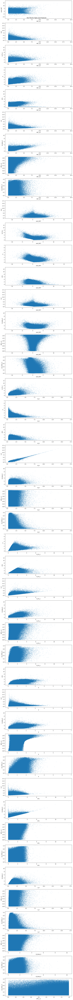

In [35]:
import itertools
import matplotlib.pyplot as plt

def create_pair_plot(features, feature_names, title):
    num_features = features.shape[1]
    feature_combinations = list(itertools.combinations(range(num_features), 2))
    
    # Create subplots with the appropriate number of rows based on the number of combinations
    fig, axs = plt.subplots(len(feature_combinations), figsize=(10, len(feature_combinations) * 3))
    
    for i, (x_idx, y_idx) in enumerate(feature_combinations):
        # Plot each pair with a scatter plot
        axs[i].scatter(features.iloc[:, x_idx], features.iloc[:, y_idx], s=1, alpha=0.5)
        axs[i].set_xlabel(feature_names[x_idx])  # Use the actual feature names for the labels
        axs[i].set_ylabel(feature_names[y_idx])
    
    # Set the main title and adjust layout for clarity
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

# Generate pair plots for low- and high-level features with proper labels
create_pair_plot(low_level_features, RawNames, "Pair Plot for Low-Level Features")
create_pair_plot(high_level_features, FeatureNames, "Pair Plot for High-Level Features")


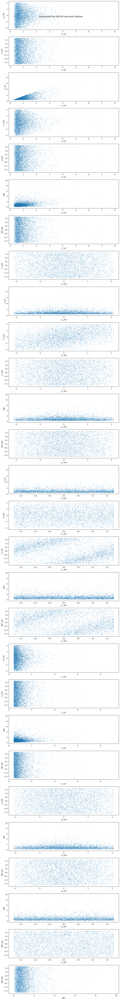

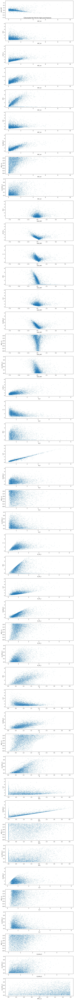

In [37]:
import random
import itertools
import matplotlib.pyplot as plt

def create_pair_plot_subsampled(features, feature_names, title, sample_size=5000):
    num_features = features.shape[1]
    feature_combinations = list(itertools.combinations(range(num_features), 2))
    
    # Create subplots with the appropriate number of rows based on the number of combinations
    fig, axs = plt.subplots(len(feature_combinations), figsize=(10, len(feature_combinations) * 3))
    
    # Subsample the data to make it clearer
    sample_indices = random.sample(range(features.shape[0]), min(sample_size, features.shape[0]))
    sampled_features = features.iloc[sample_indices]
    
    for i, (x_idx, y_idx) in enumerate(feature_combinations):
        # Scatter plot for each pair of features
        axs[i].scatter(sampled_features.iloc[:, x_idx], sampled_features.iloc[:, y_idx], s=1, alpha=0.5)
        axs[i].set_xlabel(feature_names[x_idx])  # Use actual feature names
        axs[i].set_ylabel(feature_names[y_idx])
    
    # Set the main title and adjust layout for clarity
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

# Sharper pair plot for low- and high-level features using subsampling
create_pair_plot_subsampled(low_level_features, RawNames, "Subsampled Pair Plot for Low-Level Features")
create_pair_plot_subsampled(high_level_features, FeatureNames, "Subsampled Pair Plot for High-Level Features")


In [41]:
# Feature names dictionary based on all variables in VarNames
feature_names = {
    "signal": "Signal Label",
    "l_1_pT": "Lepton 1 $p_T$ [GeV]",
    "l_1_eta": "Lepton 1 $\\eta$",
    "l_1_phi": "Lepton 1 $\\phi$",
    "l_2_pT": "Lepton 2 $p_T$ [GeV]",
    "l_2_eta": "Lepton 2 $\\eta$",
    "l_2_phi": "Lepton 2 $\\phi$",
    "MET": "Missing Transverse Momentum [GeV]",
    "MET_phi": "Missing Trans. Mom $\\phi$",
    "MET_rel": "Relative Missing Trans. Mom",
    "axial_MET": "Axial Missing Trans. Mom",
    "M_R": "$M_R$ [GeV]",
    "M_TR_2": "$M_{TR_2}$ [GeV]",
    "R": "$R$ Ratio",
    "MT2": "$MT2$ [GeV]",
    "S_R": "$S_R$",
    "M_Delta_R": "$M_{\\Delta R}$ [GeV]",
    "dPhi_r_b": "$\\Delta\\phi_{r,b}$",
    "cos_theta_r1": "$\\cos\\theta_{r1}$"
}


# Calculate the correlation matrix for the entire dataset
correlation_matrix = data.corr()

# Calculate correlation for each feature with the label (column "signal")
feature_correlations = correlation_matrix["signal"].iloc[1:]  # Exclude the label itself from correlations

# Sort features based on the absolute correlation with the label (to find the most predictive ones)
sorted_features = feature_correlations.abs().sort_values(ascending=False)

# Display sorted features with actual names
print("Features sorted by correlation with the label (best separators):")
for feature, corr_value in sorted_features.items():
    feature_name = feature_names.get(feature, feature)  # Use descriptive name if available, else default to feature name
    print(f"{feature_name}: Correlation = {corr_value:.3f}")


Features sorted by correlation with the label (best separators):
Missing Transverse Momentum [GeV]: Correlation = 0.440
$M_{TR_2}$ [GeV]: Correlation = 0.426
Lepton 1 $p_T$ [GeV]: Correlation = 0.391
Relative Missing Trans. Mom: Correlation = 0.283
$M_{\Delta R}$ [GeV]: Correlation = 0.274
$M_R$ [GeV]: Correlation = 0.270
$\cos\theta_{r1}$: Correlation = 0.267
$S_R$: Correlation = 0.262
Lepton 2 $p_T$ [GeV]: Correlation = 0.197
$R$ Ratio: Correlation = 0.109
$MT2$ [GeV]: Correlation = 0.080
Axial Missing Trans. Mom: Correlation = 0.079
$\Delta\phi_{r,b}$: Correlation = 0.033
Lepton 2 $\eta$: Correlation = 0.001
Missing Trans. Mom $\phi$: Correlation = 0.001
Lepton 1 $\phi$: Correlation = 0.000
Lepton 1 $\eta$: Correlation = 0.000
Lepton 2 $\phi$: Correlation = 0.000


### Exercise 4.2

#### Part a
Install [tabulate](https://github.com/astanin/python-tabulate). 

#### Part b
Use numpy to compute the [covariance matrix](https://numpy.org/doc/stable/reference/generated/numpy.cov.html) and [correlation matrix](https://numpy.org/doc/stable/reference/generated/numpy.corrcoef.html) between all observabes, and separately between low and high-level features.

#### Part c
Use tabulate to create a well formatted table of the covariance and correlation matrices, with nice headings and appropriate significant figures. Embed the table into this notebook.

#### Part d
Write a function that takes a dataset and appropriate arguments and performs steps b and c.  

Hint: Example code for embedding a `tabulate` table into a notebook:

In [42]:
from IPython.display import HTML, display
import tabulate
table = [["A",1,2],
        ["C",3,4],
        ["D",5,6]]
display(HTML(tabulate.tabulate(table, tablefmt='html', headers=["X","Y","Z"])))

X,Y,Z
A,1,2
C,3,4
D,5,6


In [45]:
import numpy as np

# Separate low-level and high-level features based on RawNames and FeatureNames
low_level_features = data[RawNames]
high_level_features = data[FeatureNames]

# Covariance and correlation matrices for all features (excluding the label column)
all_features = data[VarNames[1:]]  # Excludes the "signal" column
cov_matrix_all = np.cov(all_features.values, rowvar=False)
corr_matrix_all = np.corrcoef(all_features.values, rowvar=False)

# Covariance and correlation matrices for low-level features
cov_matrix_low = np.cov(low_level_features.values, rowvar=False)
corr_matrix_low = np.corrcoef(low_level_features.values, rowvar=False)

# Covariance and correlation matrices for high-level features
cov_matrix_high = np.cov(high_level_features.values, rowvar=False)
corr_matrix_high = np.corrcoef(high_level_features.values, rowvar=False)


In [46]:
from IPython.display import HTML, display
import tabulate

# Create a function to format and display a table
def display_matrix(matrix, headers, title):
    table = [[f"{val:.3f}" for val in row] for row in matrix]
    html_table = tabulate.tabulate(table, tablefmt='html', headers=headers)
    display(HTML(f"<h3>{title}</h3>"))
    display(HTML(html_table))

# Headers for the covariance and correlation matrices
all_headers = VarNames[1:]        # Exclude the "signal" label
low_headers = RawNames            # Low-level features
high_headers = FeatureNames       # High-level features

# Display covariance and correlation matrices
display_matrix(cov_matrix_all, all_headers, "Covariance Matrix (All Features)")
display_matrix(corr_matrix_all, all_headers, "Correlation Matrix (All Features)")
display_matrix(cov_matrix_low, low_headers, "Covariance Matrix (Low-Level Features)")
display_matrix(corr_matrix_low, low_headers, "Correlation Matrix (Low-Level Features)")
display_matrix(cov_matrix_high, high_headers, "Covariance Matrix (High-Level Features)")
display_matrix(corr_matrix_high, high_headers, "Correlation Matrix (High-Level Features)")


l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi,MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
0.467,-0,0,0.305,-0,0.001,0.228,-0.001,0.098,-0.01,0.364,0.287,-0.06,-0.012,0.343,0.098,-0.047,0.022
-0,1.004,-0.001,-0,0.408,-0.001,-0.002,-0.001,-0.001,-0.001,-0.001,-0.001,0,0,-0.001,-0.001,-0.001,0
0,-0.001,1.004,0.001,0,-0.267,0.001,-0.185,0.001,-0.002,0.001,0.001,0,0.001,0.001,0.001,0.001,0
0.305,-0,0.001,0.425,-0.001,0,0.079,-0.002,-0.001,0.051,0.325,0.163,-0.099,-0.069,0.322,0.006,-0.004,-0.028
-0,0.408,0,-0.001,1.006,0,0,-0,0.001,-0.001,-0.001,0,0,0.001,-0.001,0.001,-0,0
0.001,-0.001,-0.267,0,0,1.004,-0,-0.035,0.001,-0.002,0.001,0.001,0.001,0.002,0.001,0.001,-0,0
0.228,-0.002,0.001,0.079,0,-0,0.762,-0.003,0.546,0.154,0.145,0.365,0.188,0.155,0.166,0.315,0.146,0.073
-0.001,-0.001,-0.185,-0.002,-0,-0.035,-0.003,1.003,-0.005,-0,-0.001,-0.001,-0,0,-0.002,-0.001,-0.002,0
0.098,-0.001,0.001,-0.001,0.001,0.001,0.546,-0.005,0.79,-0.12,0.044,0.302,0.249,0.409,0.082,0.415,0.146,0.055
-0.01,-0.001,-0.002,0.051,-0.001,-0.002,0.154,-0,-0.12,1.005,0.017,-0.185,-0.181,-0.461,-0.041,-0.233,-0.025,-0.054


l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi,MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
1,-0.001,0,0.684,-0.001,0.001,0.383,-0.001,0.16,-0.014,0.851,0.723,-0.186,-0.021,0.811,0.229,-0.157,0.165
-0.001,1,-0.001,-0,0.406,-0.001,-0.002,-0.001,-0.002,-0.001,-0.001,-0.001,0.001,0,-0.001,-0.002,-0.002,0.002
0,-0.001,1,0.002,0,-0.266,0.001,-0.184,0.001,-0.002,0.002,0.001,0,0.001,0.002,0.001,0.002,0.001
0.684,-0,0.002,1,-0.001,0,0.14,-0.002,-0.001,0.078,0.797,0.43,-0.324,-0.123,0.799,0.014,-0.013,-0.217
-0.001,0.406,0,-0.001,1,0,0,-0,0.001,-0.001,-0.001,0,0.001,0.002,-0.001,0.001,-0.001,0.001
0.001,-0.001,-0.266,0,0,1,-0,-0.035,0.002,-0.002,0.001,0.001,0.001,0.003,0.001,0.002,-0.001,0
0.383,-0.002,0.001,0.14,0,-0,1,-0.003,0.704,0.176,0.264,0.72,0.457,0.206,0.307,0.579,0.383,0.425
-0.001,-0.001,-0.184,-0.002,-0,-0.035,-0.003,1,-0.005,-0,-0.002,-0.002,-0,0,-0.003,-0.001,-0.004,0.001
0.16,-0.002,0.001,-0.001,0.001,0.002,0.704,-0.005,1,-0.134,0.078,0.584,0.595,0.535,0.15,0.748,0.378,0.316
-0.014,-0.001,-0.002,0.078,-0.001,-0.002,0.176,-0,-0.134,1,0.027,-0.317,-0.383,-0.535,-0.067,-0.373,-0.057,-0.272


l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi
0.467,-0,0,0.305,-0,0.001,0.228,-0.001
-0,1.004,-0.001,-0,0.408,-0.001,-0.002,-0.001
0,-0.001,1.004,0.001,0,-0.267,0.001,-0.185
0.305,-0,0.001,0.425,-0.001,0,0.079,-0.002
-0,0.408,0,-0.001,1.006,0,0,-0
0.001,-0.001,-0.267,0,0,1.004,-0,-0.035
0.228,-0.002,0.001,0.079,0,-0,0.762,-0.003
-0.001,-0.001,-0.185,-0.002,-0,-0.035,-0.003,1.003


l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi
1,-0.001,0,0.684,-0.001,0.001,0.383,-0.001
-0.001,1,-0.001,-0,0.406,-0.001,-0.002,-0.001
0,-0.001,1,0.002,0,-0.266,0.001,-0.184
0.684,-0,0.002,1,-0.001,0,0.14,-0.002
-0.001,0.406,0,-0.001,1,0,0,-0
0.001,-0.001,-0.266,0,0,1,-0,-0.035
0.383,-0.002,0.001,0.14,0,-0,1,-0.003
-0.001,-0.001,-0.184,-0.002,-0,-0.035,-0.003,1


MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
0.79,-0.12,0.044,0.302,0.249,0.409,0.082,0.415,0.146,0.055
-0.12,1.005,0.017,-0.185,-0.181,-0.461,-0.041,-0.233,-0.025,-0.054
0.044,0.017,0.392,0.21,-0.113,-0.037,0.38,0.074,-0.029,-0.014
0.302,-0.185,0.21,0.338,0.104,0.189,0.228,0.242,0.058,0.052
0.249,-0.181,-0.113,0.104,0.222,0.232,-0.083,0.165,0.087,0.058
0.409,-0.461,-0.037,0.189,0.232,0.738,-0.011,0.433,0.021,0.045
0.082,-0.041,0.38,0.228,-0.083,-0.011,0.382,0.096,-0.003,-0.01
0.415,-0.233,0.074,0.242,0.165,0.433,0.096,0.389,0.042,0.039
0.146,-0.025,-0.029,0.058,0.087,0.021,-0.003,0.042,0.19,0.009
0.055,-0.054,-0.014,0.052,0.058,0.045,-0.01,0.039,0.009,0.039


MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
1,-0.134,0.078,0.584,0.595,0.535,0.15,0.748,0.378,0.316
-0.134,1,0.027,-0.317,-0.383,-0.535,-0.067,-0.373,-0.057,-0.272
0.078,0.027,1,0.577,-0.383,-0.068,0.981,0.189,-0.106,-0.116
0.584,-0.317,0.577,1,0.38,0.379,0.635,0.668,0.229,0.451
0.595,-0.383,-0.383,0.38,1,0.574,-0.287,0.564,0.424,0.627
0.535,-0.535,-0.068,0.379,0.574,1,-0.021,0.809,0.056,0.264
0.15,-0.067,0.981,0.635,-0.287,-0.021,1,0.249,-0.013,-0.085
0.748,-0.373,0.189,0.668,0.564,0.809,0.249,1,0.155,0.319
0.378,-0.057,-0.106,0.229,0.424,0.056,-0.013,0.155,1,0.106
0.316,-0.272,-0.116,0.451,0.627,0.264,-0.085,0.319,0.106,1


In [48]:
def compute_and_display_cov_corr(data):
    # Separate low and high-level features based on RawNames and FeatureNames
    low_level_features = data[RawNames]
    high_level_features = data[FeatureNames]
    all_features = data[VarNames[1:]]  # Exclude the "signal" column

    # Compute covariance and correlation matrices
    matrices = {
        "Covariance Matrix (All Features)": np.cov(all_features.values, rowvar=False),
        "Correlation Matrix (All Features)": np.corrcoef(all_features.values, rowvar=False),
        "Covariance Matrix (Low-Level Features)": np.cov(low_level_features.values, rowvar=False),
        "Correlation Matrix (Low-Level Features)": np.corrcoef(low_level_features.values, rowvar=False),
        "Covariance Matrix (High-Level Features)": np.cov(high_level_features.values, rowvar=False),
        "Correlation Matrix (High-Level Features)": np.corrcoef(high_level_features.values, rowvar=False)
    }

    # Define headers for each feature set
    all_headers = VarNames[1:]  # Exclude "signal" for all features
    low_headers = RawNames      # Low-level feature names
    high_headers = FeatureNames  # High-level feature names

    # Display matrices with appropriate headers
    for title, matrix in matrices.items():
        if "Low-Level" in title:
            display_matrix(matrix, low_headers, title)
        elif "High-Level" in title:
            display_matrix(matrix, high_headers, title)
        else:
            display_matrix(matrix, all_headers, title)

# Use the function
compute_and_display_cov_corr(data)


l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi,MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
0.467,-0,0,0.305,-0,0.001,0.228,-0.001,0.098,-0.01,0.364,0.287,-0.06,-0.012,0.343,0.098,-0.047,0.022
-0,1.004,-0.001,-0,0.408,-0.001,-0.002,-0.001,-0.001,-0.001,-0.001,-0.001,0,0,-0.001,-0.001,-0.001,0
0,-0.001,1.004,0.001,0,-0.267,0.001,-0.185,0.001,-0.002,0.001,0.001,0,0.001,0.001,0.001,0.001,0
0.305,-0,0.001,0.425,-0.001,0,0.079,-0.002,-0.001,0.051,0.325,0.163,-0.099,-0.069,0.322,0.006,-0.004,-0.028
-0,0.408,0,-0.001,1.006,0,0,-0,0.001,-0.001,-0.001,0,0,0.001,-0.001,0.001,-0,0
0.001,-0.001,-0.267,0,0,1.004,-0,-0.035,0.001,-0.002,0.001,0.001,0.001,0.002,0.001,0.001,-0,0
0.228,-0.002,0.001,0.079,0,-0,0.762,-0.003,0.546,0.154,0.145,0.365,0.188,0.155,0.166,0.315,0.146,0.073
-0.001,-0.001,-0.185,-0.002,-0,-0.035,-0.003,1.003,-0.005,-0,-0.001,-0.001,-0,0,-0.002,-0.001,-0.002,0
0.098,-0.001,0.001,-0.001,0.001,0.001,0.546,-0.005,0.79,-0.12,0.044,0.302,0.249,0.409,0.082,0.415,0.146,0.055
-0.01,-0.001,-0.002,0.051,-0.001,-0.002,0.154,-0,-0.12,1.005,0.017,-0.185,-0.181,-0.461,-0.041,-0.233,-0.025,-0.054


l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi,MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
1,-0.001,0,0.684,-0.001,0.001,0.383,-0.001,0.16,-0.014,0.851,0.723,-0.186,-0.021,0.811,0.229,-0.157,0.165
-0.001,1,-0.001,-0,0.406,-0.001,-0.002,-0.001,-0.002,-0.001,-0.001,-0.001,0.001,0,-0.001,-0.002,-0.002,0.002
0,-0.001,1,0.002,0,-0.266,0.001,-0.184,0.001,-0.002,0.002,0.001,0,0.001,0.002,0.001,0.002,0.001
0.684,-0,0.002,1,-0.001,0,0.14,-0.002,-0.001,0.078,0.797,0.43,-0.324,-0.123,0.799,0.014,-0.013,-0.217
-0.001,0.406,0,-0.001,1,0,0,-0,0.001,-0.001,-0.001,0,0.001,0.002,-0.001,0.001,-0.001,0.001
0.001,-0.001,-0.266,0,0,1,-0,-0.035,0.002,-0.002,0.001,0.001,0.001,0.003,0.001,0.002,-0.001,0
0.383,-0.002,0.001,0.14,0,-0,1,-0.003,0.704,0.176,0.264,0.72,0.457,0.206,0.307,0.579,0.383,0.425
-0.001,-0.001,-0.184,-0.002,-0,-0.035,-0.003,1,-0.005,-0,-0.002,-0.002,-0,0,-0.003,-0.001,-0.004,0.001
0.16,-0.002,0.001,-0.001,0.001,0.002,0.704,-0.005,1,-0.134,0.078,0.584,0.595,0.535,0.15,0.748,0.378,0.316
-0.014,-0.001,-0.002,0.078,-0.001,-0.002,0.176,-0,-0.134,1,0.027,-0.317,-0.383,-0.535,-0.067,-0.373,-0.057,-0.272


l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi
0.467,-0,0,0.305,-0,0.001,0.228,-0.001
-0,1.004,-0.001,-0,0.408,-0.001,-0.002,-0.001
0,-0.001,1.004,0.001,0,-0.267,0.001,-0.185
0.305,-0,0.001,0.425,-0.001,0,0.079,-0.002
-0,0.408,0,-0.001,1.006,0,0,-0
0.001,-0.001,-0.267,0,0,1.004,-0,-0.035
0.228,-0.002,0.001,0.079,0,-0,0.762,-0.003
-0.001,-0.001,-0.185,-0.002,-0,-0.035,-0.003,1.003


l_1_pT,l_1_eta,l_1_phi,l_2_pT,l_2_eta,l_2_phi,MET,MET_phi
1,-0.001,0,0.684,-0.001,0.001,0.383,-0.001
-0.001,1,-0.001,-0,0.406,-0.001,-0.002,-0.001
0,-0.001,1,0.002,0,-0.266,0.001,-0.184
0.684,-0,0.002,1,-0.001,0,0.14,-0.002
-0.001,0.406,0,-0.001,1,0,0,-0
0.001,-0.001,-0.266,0,0,1,-0,-0.035
0.383,-0.002,0.001,0.14,0,-0,1,-0.003
-0.001,-0.001,-0.184,-0.002,-0,-0.035,-0.003,1


MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
0.79,-0.12,0.044,0.302,0.249,0.409,0.082,0.415,0.146,0.055
-0.12,1.005,0.017,-0.185,-0.181,-0.461,-0.041,-0.233,-0.025,-0.054
0.044,0.017,0.392,0.21,-0.113,-0.037,0.38,0.074,-0.029,-0.014
0.302,-0.185,0.21,0.338,0.104,0.189,0.228,0.242,0.058,0.052
0.249,-0.181,-0.113,0.104,0.222,0.232,-0.083,0.165,0.087,0.058
0.409,-0.461,-0.037,0.189,0.232,0.738,-0.011,0.433,0.021,0.045
0.082,-0.041,0.38,0.228,-0.083,-0.011,0.382,0.096,-0.003,-0.01
0.415,-0.233,0.074,0.242,0.165,0.433,0.096,0.389,0.042,0.039
0.146,-0.025,-0.029,0.058,0.087,0.021,-0.003,0.042,0.19,0.009
0.055,-0.054,-0.014,0.052,0.058,0.045,-0.01,0.039,0.009,0.039


MET_rel,axial_MET,M_R,M_TR_2,R,MT2,S_R,M_Delta_R,dPhi_r_b,cos_theta_r1
1,-0.134,0.078,0.584,0.595,0.535,0.15,0.748,0.378,0.316
-0.134,1,0.027,-0.317,-0.383,-0.535,-0.067,-0.373,-0.057,-0.272
0.078,0.027,1,0.577,-0.383,-0.068,0.981,0.189,-0.106,-0.116
0.584,-0.317,0.577,1,0.38,0.379,0.635,0.668,0.229,0.451
0.595,-0.383,-0.383,0.38,1,0.574,-0.287,0.564,0.424,0.627
0.535,-0.535,-0.068,0.379,0.574,1,-0.021,0.809,0.056,0.264
0.15,-0.067,0.981,0.635,-0.287,-0.021,1,0.249,-0.013,-0.085
0.748,-0.373,0.189,0.668,0.564,0.809,0.249,1,0.155,0.319
0.378,-0.057,-0.106,0.229,0.424,0.056,-0.013,0.155,1,0.106
0.316,-0.272,-0.116,0.451,0.627,0.264,-0.085,0.319,0.106,1


## Exercise 5: Selection

### Exercise 5.1

Part a
By looking at the signal/background distributions for each observable (e.g. $x$) determine which selection criteria would be optimal: 

1. $x > x_c$
2. $x < x_c$
3. $|x - \mu| > x_c$
4. $|x - \mu| < x_c$

where $x_c$ is value to be determined below.

### Exercise 5.2

Plot the True Positive Rate (TPR) (aka signal efficiency $\epsilon_S(x_c)$) and False Positive Rate (FPR) (aka background efficiency $\epsilon_B(x_c)$) as function of $x_c$ for applying the strategy in part a to each observable. 

### Exercise 5.3
Assume 3 different scenarios corresponding to different numbers of signal and background events expected in data:

1. Expect $N_S=10$, $N_B=100$.
1. Expect $N_S=100$, $N_B=1000$.
1. Expect $N_S=1000$, $N_B=10000$.
1. Expect $N_S=10000$, $N_B=100000$.

Plot the significance ($\sigma_{S'}$) for each observable as function of $x_c$ for each scenario, where 

$\sigma_{S'}= \frac{N'_S}{\sqrt{N'_S+N'_B}}$

and $N'_{S,B} = \epsilon_{S,B}(x_c) * N_{S,B}$.

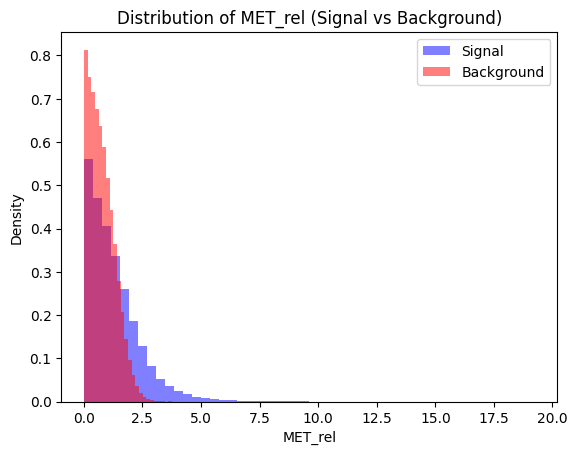

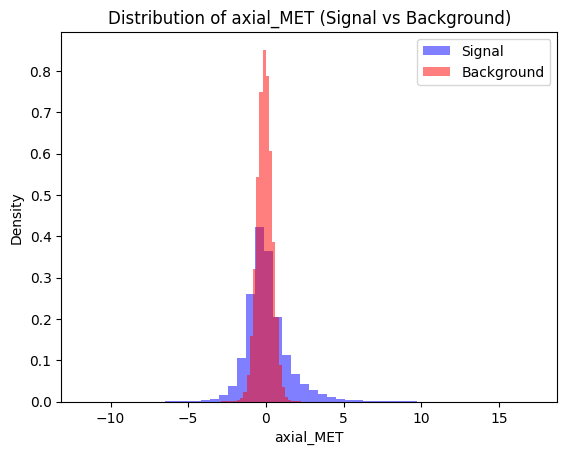

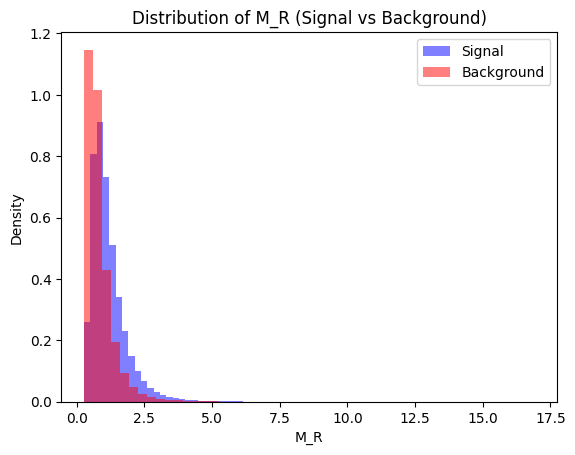

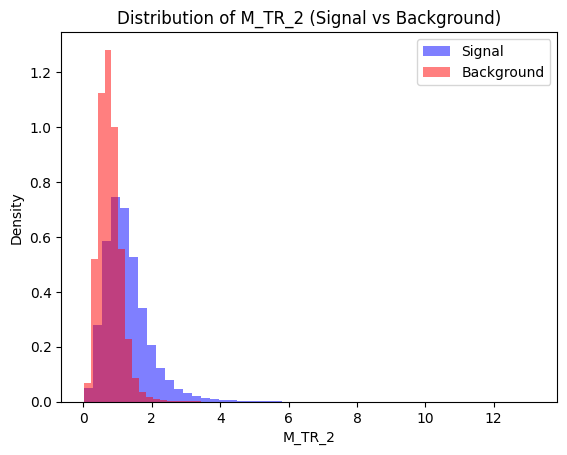

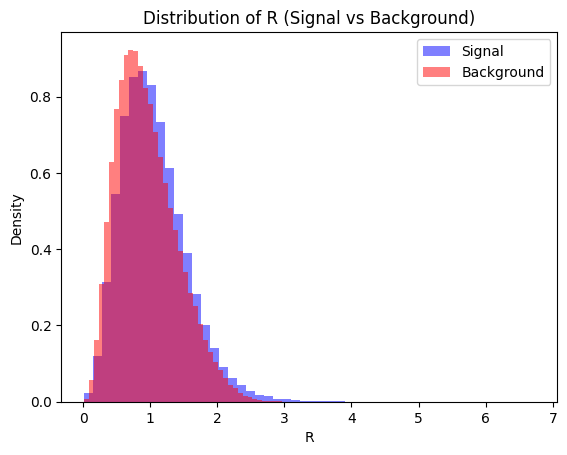

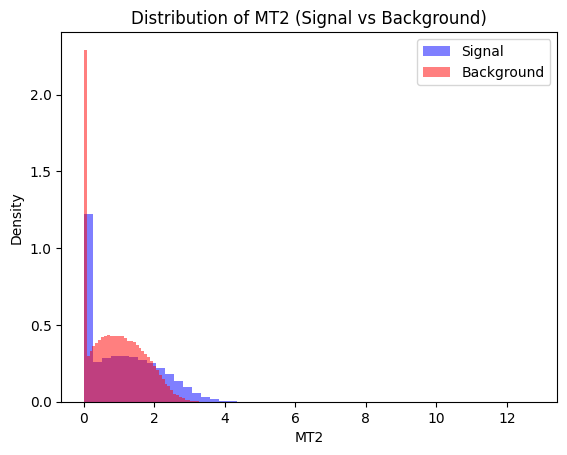

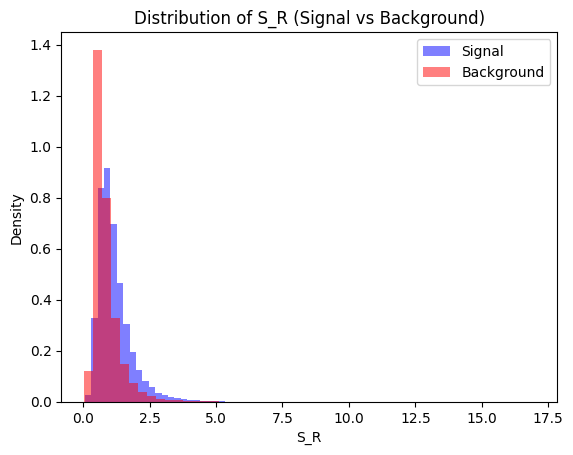

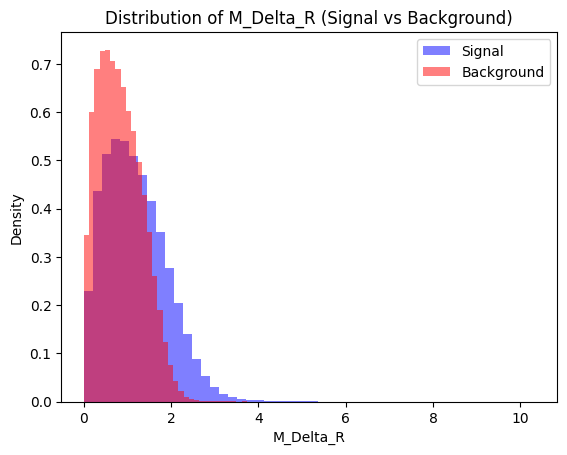

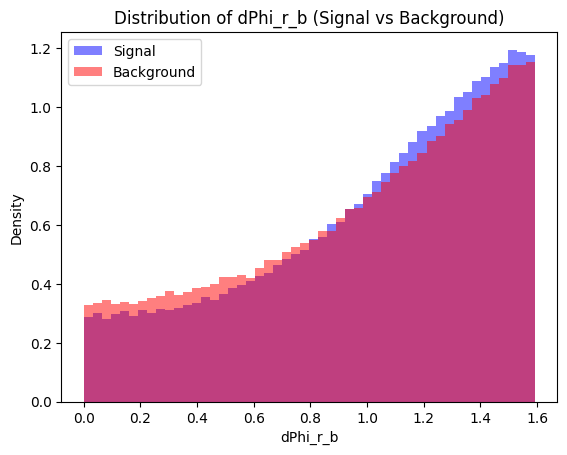

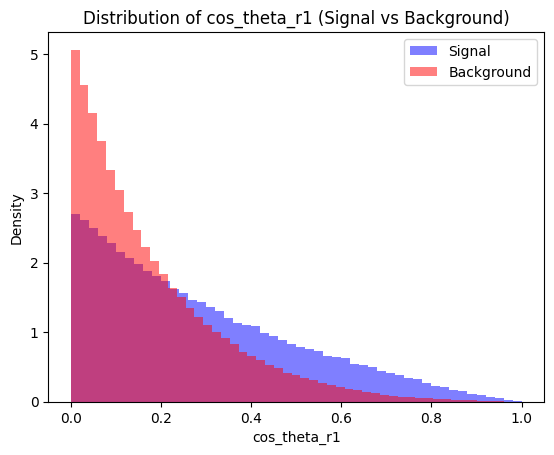

In [49]:
import matplotlib.pyplot as plt
import numpy as np

# Function to plot signal and background distributions for each observable
def plot_distributions(observable, signal_data, background_data, xc=None):
    # Plot histograms for the observable in signal and background data
    plt.hist(signal_data[observable], bins=50, alpha=0.5, label='Signal', color='blue', density=True)
    plt.hist(background_data[observable], bins=50, alpha=0.5, label='Background', color='red', density=True)
    
    # Plot vertical line at xc, if specified, for comparison
    if xc is not None:
        plt.axvline(x=xc, color='black', linestyle='--', label=f'$x_c = {xc}$')
    
    plt.xlabel(observable)
    plt.ylabel("Density")
    plt.legend()
    plt.title(f"Distribution of {observable} (Signal vs Background)")
    plt.show()

# Separate signal and background data
signal_data = data[data['signal'] == 1]
background_data = data[data['signal'] == 0]

# Define the observables to analyze (can be RawNames, FeatureNames, or a subset)
observables = FeatureNames 

# Plot distributions for each observable
for observable in observables:
    plot_distributions(observable, signal_data, background_data)


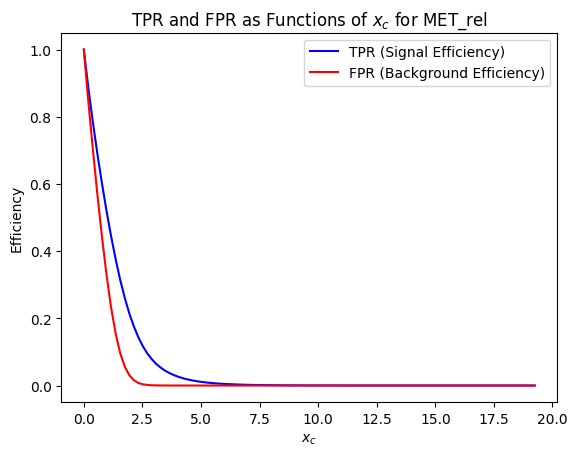

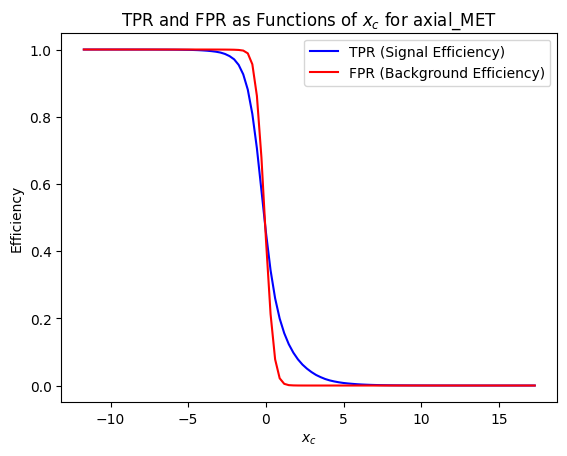

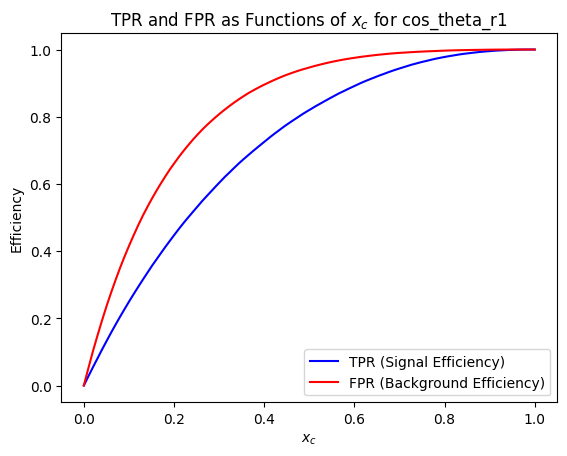

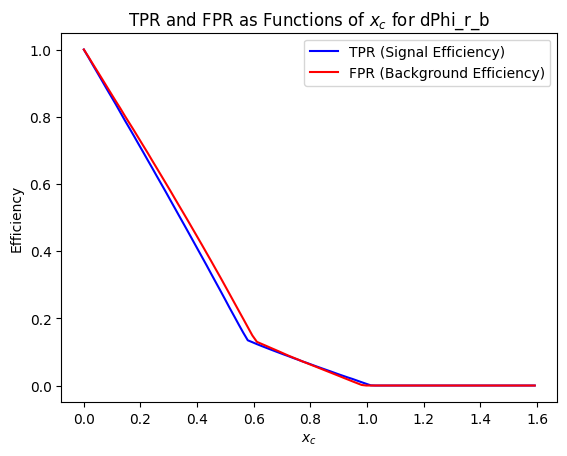

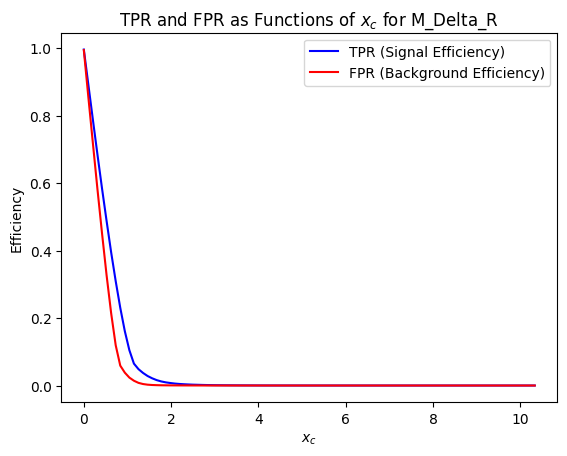

In [54]:
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate TPR and FPR based on selection criterion
def compute_tpr_fpr(observable, signal_data, background_data, criterion, xc_range):
    tpr = []
    fpr = []
    
    for xc in xc_range:
        if criterion == "greater":
            selected_signal = signal_data[observable] > xc
            selected_background = background_data[observable] > xc
        elif criterion == "less":
            selected_signal = signal_data[observable] < xc
            selected_background = background_data[observable] < xc
        elif criterion == "abs_greater":
            selected_signal = np.abs(signal_data[observable] - signal_data[observable].mean()) > xc
            selected_background = np.abs(background_data[observable] - background_data[observable].mean()) > xc
        elif criterion == "abs_less":
            selected_signal = np.abs(signal_data[observable] - signal_data[observable].mean()) < xc
            selected_background = np.abs(background_data[observable] - background_data[observable].mean()) < xc

        # Calculate TPR and FPR
        tpr_value = selected_signal.sum() / len(signal_data[observable])
        fpr_value = selected_background.sum() / len(background_data[observable])
        
        tpr.append(tpr_value)
        fpr.append(fpr_value)
    
    return tpr, fpr

# Observables and their selection criteria
observable_criteria = {
    "MET_rel": "greater",
    "axial_MET": "greater",
    "cos_theta_r1": "less",
    "dPhi_r_b": "abs_greater",
    "M_Delta_R": "abs_greater"
}

# Loop over each observable to plot TPR and FPR
for observable, criterion in observable_criteria.items():
    # Define the range of x_c values for this observable
    xc_range = np.linspace(signal_data[observable].min(), signal_data[observable].max(), 100)
    
    # Compute TPR and FPR
    tpr, fpr = compute_tpr_fpr(observable, signal_data, background_data, criterion, xc_range)
    
    # Plot TPR and FPR
    plt.plot(xc_range, tpr, label="TPR (Signal Efficiency)", color="blue")
    plt.plot(xc_range, fpr, label="FPR (Background Efficiency)", color="red")
    plt.xlabel("$x_c$")
    plt.ylabel("Efficiency")
    plt.legend()
    plt.title(f"TPR and FPR as Functions of $x_c$ for {observable}")
    plt.show()


<>:30: SyntaxWarning: invalid escape sequence '\s'
<>:30: SyntaxWarning: invalid escape sequence '\s'
C:\Users\helix\AppData\Local\Temp\ipykernel_18232\1837679696.py:30: SyntaxWarning: invalid escape sequence '\s'
  plt.ylabel("Significance ($\sigma_{S'}$)")


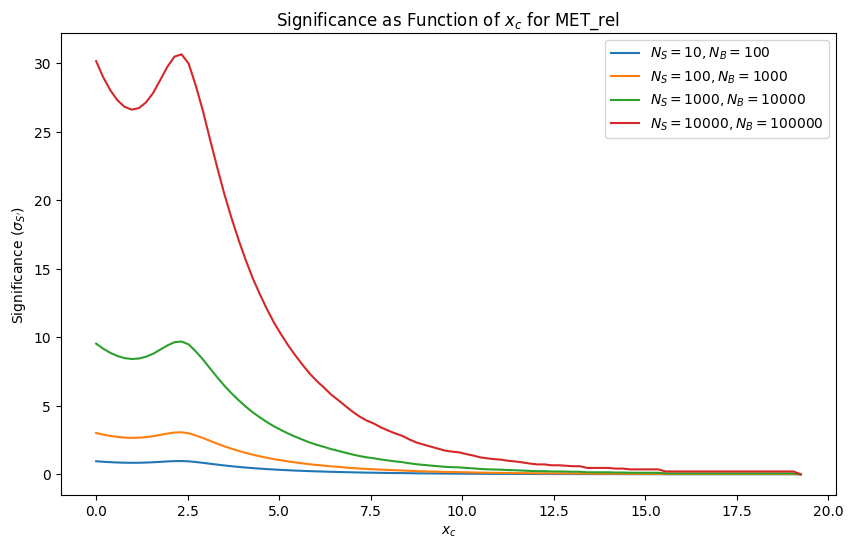

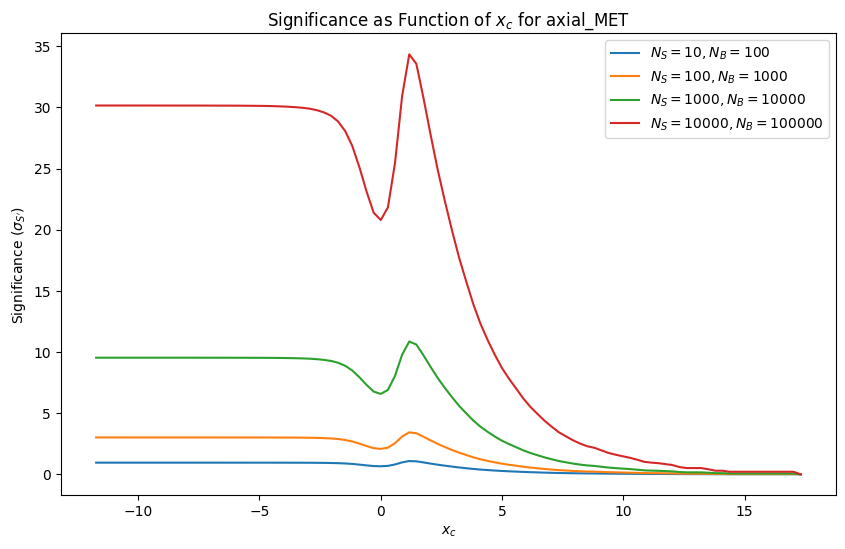

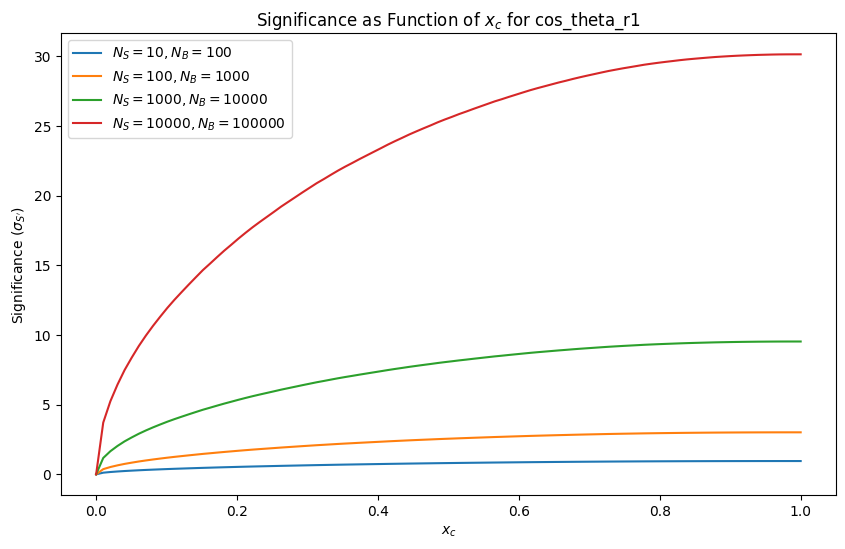

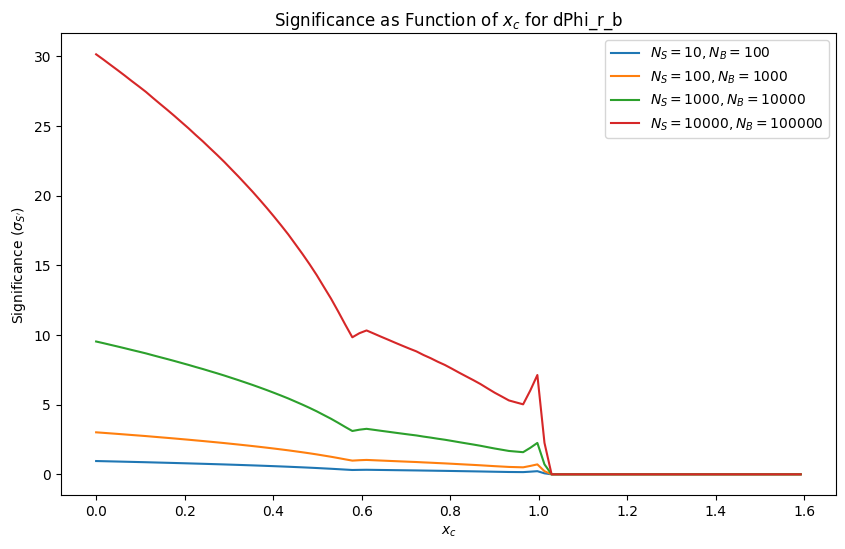

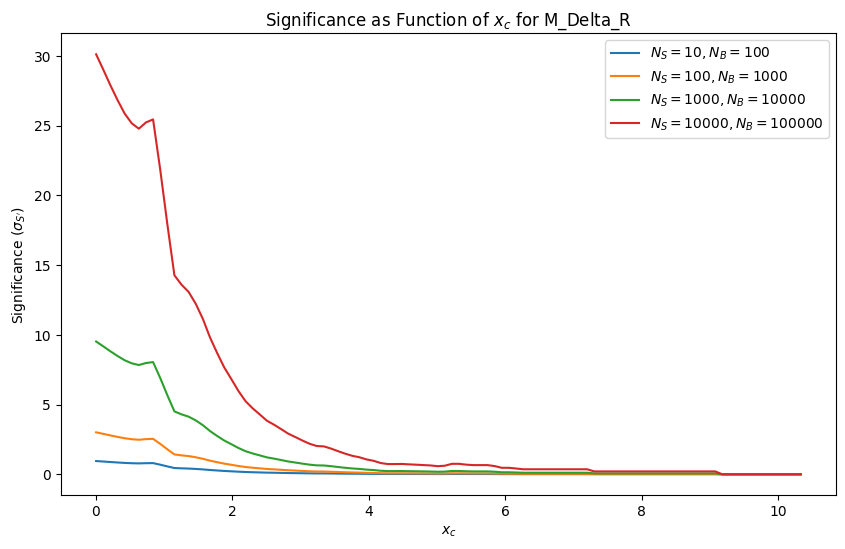

In [56]:
# Define different scenarios for initial signal and background counts
scenarios = [(10, 100), (100, 1000), (1000, 10000), (10000, 100000)]

# Function to calculate significance based on TPR and FPR for a range of x_c values
def compute_significance(tpr, fpr, Ns, Nb):
    significance = []
    for epsilon_S, epsilon_B in zip(tpr, fpr):
        Ns_prime = epsilon_S * Ns
        Nb_prime = epsilon_B * Nb
        # Calculate significance only if Ns_prime + Nb_prime > 0
        if Ns_prime + Nb_prime > 0:
            sigma_S = Ns_prime / np.sqrt(Ns_prime + Nb_prime)
        else:
            sigma_S = 0
        significance.append(sigma_S)
    return significance

# Plot significance for each observable across different scenarios
for observable, criterion in observable_criteria.items():
    xc_range = np.linspace(signal_data[observable].min(), signal_data[observable].max(), 100)
    tpr, fpr = compute_tpr_fpr(observable, signal_data, background_data, criterion, xc_range)
    
    # Plot significance for each scenario
    plt.figure(figsize=(10, 6))
    for Ns, Nb in scenarios:
        significance = compute_significance(tpr, fpr, Ns, Nb)
        plt.plot(xc_range, significance, label=f"$N_S={Ns}, N_B={Nb}$")
    
    plt.xlabel("$x_c$")
    plt.ylabel("Significance ($\sigma_{S'}$)")
    plt.title(f"Significance as Function of $x_c$ for {observable}")
    plt.legend()
    plt.show()


In [57]:
from matplotlib.backends.backend_pdf import PdfPages

# Define the filename for the PDF
pdf_filename = "significance_plots.pdf"

# Create a PDF file to store all significance plots
with PdfPages(pdf_filename) as pdf:
    # Loop over each observable to plot significance and save each to the PDF
    for observable, criterion in observable_criteria.items():
        # Define the range of x_c values for this observable
        xc_range = np.linspace(signal_data[observable].min(), signal_data[observable].max(), 100)
        
        # Compute TPR and FPR
        tpr, fpr = compute_tpr_fpr(observable, signal_data, background_data, criterion, xc_range)
        
        # Create a new figure for each observable
        fig, ax = plt.subplots(figsize=(10, 6))
        
        # Plot significance for each scenario
        for Ns, Nb in scenarios:
            significance = compute_significance(tpr, fpr, Ns, Nb)
            ax.plot(xc_range, significance, label=f"$N_S={Ns}, N_B={Nb}$")
        
        ax.set_xlabel("$x_c$")
        ax.set_ylabel("Significance ($\sigma_{S'}$)")
        ax.set_title(f"Significance as Function of $x_c$ for {observable}")
        ax.legend()
        
        # Save the current figure to the PDF
        pdf.savefig(fig)
        plt.close(fig)  # Close the figure to free memory

print(f"All significance plots saved to {pdf_filename}")


<>:25: SyntaxWarning: invalid escape sequence '\s'
<>:25: SyntaxWarning: invalid escape sequence '\s'
C:\Users\helix\AppData\Local\Temp\ipykernel_18232\2151127719.py:25: SyntaxWarning: invalid escape sequence '\s'
  ax.set_ylabel("Significance ($\sigma_{S'}$)")


All significance plots saved to significance_plots.pdf


## Exercise 6: Cut Flow


### Exercise 6.1

For each above scenario, choose a subset (minumum 3) of observables to use for selections, and values of $x_c$ based on your significance plots (part 3c). 

### Exercise 6.2
Create a "cut-flow" table for each scenario where you successively make the selections on each observable and tabulate $\epsilon_S$, $\epsilon_B$, $N'_S$, $N'_B$, and $\sigma_{S'}$.

### Exercise 6.3
In 3c above you computed the significance for each observable assuming to make no other selections on any other observable. If the variables are correlated, then this assumption can lead to non-optimial results when selecting on multiple variables. By looking at the correlation matrices and your answers to 4b, identify where this effect could be most detrimental to the significance. Attempt to correct the issue by applying the selection in one observable and then optimizing (part 3c) for a second observable. What happens if you change the order of your selection (make selection on second and optimize on first)?




In [58]:
import pandas as pd

# Define the scenarios and initial counts for signal and background events
scenarios = [(10, 100), (100, 1000), (1000, 10000), (10000, 100000)]

# Selected observables and their thresholds (from Exercise 6.1)
selected_observables = {
    "MET_rel": {"criterion": "greater", "xc": 10},
    "axial_MET": {"criterion": "greater", "xc": 7.5},
    "cos_theta_r1": {"criterion": "less", "xc": 0.2}
}

# Function to apply cut and calculate efficiencies and remaining events
def apply_cut_flow(scenario, signal_data, background_data, observables):
    Ns, Nb = scenario
    cut_flow_data = []

    for observable, params in observables.items():
        criterion = params["criterion"]
        xc = params["xc"]

        # Calculate TPR and FPR based on the criterion
        tpr, fpr = compute_tpr_fpr(observable, signal_data, background_data, criterion, [xc])
        
        epsilon_S = tpr[0]
        epsilon_B = fpr[0]

        # Calculate remaining events after the cut
        Ns_prime = epsilon_S * Ns
        Nb_prime = epsilon_B * Nb

        # Calculate significance
        sigma_S = Ns_prime / np.sqrt(Ns_prime + Nb_prime) if (Ns_prime + Nb_prime) > 0 else 0

        # Store data for the cut-flow table
        cut_flow_data.append({
            "Observable": observable,
            "x_c": xc,
            "ε_S": epsilon_S,
            "ε_B": epsilon_B,
            "N_S'": Ns_prime,
            "N_B'": Nb_prime,
            "σ_S'": sigma_S
        })

        # Update Ns and Nb for the next cut in sequence
        Ns, Nb = Ns_prime, Nb_prime

    return pd.DataFrame(cut_flow_data)

# Generate cut-flow tables for each scenario and display them
for scenario in scenarios:
    print(f"\nCut-Flow Table for Scenario N_S={scenario[0]}, N_B={scenario[1]}")
    cut_flow_table = apply_cut_flow(scenario, signal_data, background_data, selected_observables)
    display(cut_flow_table)



Cut-Flow Table for Scenario N_S=10, N_B=100


,Observable,x_c,ε_S,ε_B,N_S',N_B',σ_S'
0,MET_rel,10.0,0.000231,0.000000,0.002312,0.0,0.048083
1,axial_MET,7.5,0.001056,0.000000,0.000002,0.0,0.001562
2,cos_theta_r1,0.2,0.447006,0.660405,0.000001,0.0,0.001044



Cut-Flow Table for Scenario N_S=100, N_B=1000


,Observable,x_c,ε_S,ε_B,N_S',N_B',σ_S'
0,MET_rel,10.0,0.000231,0.000000,0.023119,0.0,0.152051
1,axial_MET,7.5,0.001056,0.000000,0.000024,0.0,0.004940
2,cos_theta_r1,0.2,0.447006,0.660405,0.000011,0.0,0.003303



Cut-Flow Table for Scenario N_S=1000, N_B=10000


,Observable,x_c,ε_S,ε_B,N_S',N_B',σ_S'
0,MET_rel,10.0,0.000231,0.000000,0.231194,0.0,0.480826
1,axial_MET,7.5,0.001056,0.000000,0.000244,0.0,0.015622
2,cos_theta_r1,0.2,0.447006,0.660405,0.000109,0.0,0.010445



Cut-Flow Table for Scenario N_S=10000, N_B=100000


,Observable,x_c,ε_S,ε_B,N_S',N_B',σ_S'
0,MET_rel,10.0,0.000231,0.000000,2.311937,0.0,1.520506
1,axial_MET,7.5,0.001056,0.000000,0.002441,0.0,0.049402
2,cos_theta_r1,0.2,0.447006,0.660405,0.001091,0.0,0.033030


In [59]:
# Define different orders of cuts for comparison
cut_orders = [
    ["MET_rel", "axial_MET", "cos_theta_r1"],  # Original order
    ["cos_theta_r1", "MET_rel", "axial_MET"],  # Alternative order 1
    ["axial_MET", "cos_theta_r1", "MET_rel"]   # Alternative order 2
]

# Function to apply cut flow in a specific order and calculate the cut-flow table
def apply_cut_flow_in_order(scenario, signal_data, background_data, observables, order):
    Ns, Nb = scenario
    cut_flow_data = []

    for observable in order:
        params = observables[observable]
        criterion = params["criterion"]
        xc = params["xc"]

        # Calculate TPR and FPR based on the criterion
        tpr, fpr = compute_tpr_fpr(observable, signal_data, background_data, criterion, [xc])

        epsilon_S = tpr[0]
        epsilon_B = fpr[0]

        # Calculate remaining events after the cut
        Ns_prime = epsilon_S * Ns
        Nb_prime = epsilon_B * Nb

        # Calculate significance
        sigma_S = Ns_prime / np.sqrt(Ns_prime + Nb_prime) if (Ns_prime + Nb_prime) > 0 else 0

        # Store data for the cut-flow table
        cut_flow_data.append({
            "Observable": observable,
            "x_c": xc,
            "ε_S": epsilon_S,
            "ε_B": epsilon_B,
            "N_S'": Ns_prime,
            "N_B'": Nb_prime,
            "σ_S'": sigma_S
        })

        # Update Ns and Nb for the next cut in sequence
        Ns, Nb = Ns_prime, Nb_prime

    return pd.DataFrame(cut_flow_data)

# Apply cut flow for each scenario and order, and print results
for scenario in scenarios:
    for order in cut_orders:
        print(f"\nCut-Flow Table for Scenario N_S={scenario[0]}, N_B={scenario[1]} with Cut Order {order}")
        cut_flow_table = apply_cut_flow_in_order(scenario, signal_data, background_data, selected_observables, order)
        display(cut_flow_table)



Cut-Flow Table for Scenario N_S=10, N_B=100 with Cut Order ['MET_rel', 'axial_MET', 'cos_theta_r1']


,Observable,x_c,ε_S,ε_B,N_S',N_B',σ_S'
0,MET_rel,10.0,0.000231,0.000000,0.002312,0.0,0.048083
1,axial_MET,7.5,0.001056,0.000000,0.000002,0.0,0.001562
2,cos_theta_r1,0.2,0.447006,0.660405,0.000001,0.0,0.001044



Cut-Flow Table for Scenario N_S=10, N_B=100 with Cut Order ['cos_theta_r1', 'MET_rel', 'axial_MET']


,Observable,x_c,ε_S,ε_B,N_S',N_B',σ_S'
0,cos_theta_r1,0.2,0.447006,0.660405,4.470065,66.040516,0.532337
1,MET_rel,10.0,0.000231,0.000000,0.001033,0.000000,0.032147
2,axial_MET,7.5,0.001056,0.000000,0.000001,0.000000,0.001044



Cut-Flow Table for Scenario N_S=10, N_B=100 with Cut Order ['axial_MET', 'cos_theta_r1', 'MET_rel']


,Observable,x_c,ε_S,ε_B,N_S',N_B',σ_S'
0,axial_MET,7.5,0.001056,0.000000,0.010556,0.0,0.102744
1,cos_theta_r1,0.2,0.447006,0.660405,0.004719,0.0,0.068693
2,MET_rel,10.0,0.000231,0.000000,0.000001,0.0,0.001044



Cut-Flow Table for Scenario N_S=100, N_B=1000 with Cut Order ['MET_rel', 'axial_MET', 'cos_theta_r1']


,Observable,x_c,ε_S,ε_B,N_S',N_B',σ_S'
0,MET_rel,10.0,0.000231,0.000000,0.023119,0.0,0.152051
1,axial_MET,7.5,0.001056,0.000000,0.000024,0.0,0.004940
2,cos_theta_r1,0.2,0.447006,0.660405,0.000011,0.0,0.003303



Cut-Flow Table for Scenario N_S=100, N_B=1000 with Cut Order ['cos_theta_r1', 'MET_rel', 'axial_MET']


,Observable,x_c,ε_S,ε_B,N_S',N_B',σ_S'
0,cos_theta_r1,0.2,0.447006,0.660405,44.700648,660.405163,1.683397
1,MET_rel,10.0,0.000231,0.000000,0.010335,0.000000,0.101659
2,axial_MET,7.5,0.001056,0.000000,0.000011,0.000000,0.003303



Cut-Flow Table for Scenario N_S=100, N_B=1000 with Cut Order ['axial_MET', 'cos_theta_r1', 'MET_rel']


,Observable,x_c,ε_S,ε_B,N_S',N_B',σ_S'
0,axial_MET,7.5,0.001056,0.000000,0.105564,0.0,0.324906
1,cos_theta_r1,0.2,0.447006,0.660405,0.047188,0.0,0.217227
2,MET_rel,10.0,0.000231,0.000000,0.000011,0.0,0.003303



Cut-Flow Table for Scenario N_S=1000, N_B=10000 with Cut Order ['MET_rel', 'axial_MET', 'cos_theta_r1']


,Observable,x_c,ε_S,ε_B,N_S',N_B',σ_S'
0,MET_rel,10.0,0.000231,0.000000,0.231194,0.0,0.480826
1,axial_MET,7.5,0.001056,0.000000,0.000244,0.0,0.015622
2,cos_theta_r1,0.2,0.447006,0.660405,0.000109,0.0,0.010445



Cut-Flow Table for Scenario N_S=1000, N_B=10000 with Cut Order ['cos_theta_r1', 'MET_rel', 'axial_MET']


,Observable,x_c,ε_S,ε_B,N_S',N_B',σ_S'
0,cos_theta_r1,0.2,0.447006,0.660405,447.006478,6604.051633,5.323370
1,MET_rel,10.0,0.000231,0.000000,0.103345,0.000000,0.321473
2,axial_MET,7.5,0.001056,0.000000,0.000109,0.000000,0.010445



Cut-Flow Table for Scenario N_S=1000, N_B=10000 with Cut Order ['axial_MET', 'cos_theta_r1', 'MET_rel']


,Observable,x_c,ε_S,ε_B,N_S',N_B',σ_S'
0,axial_MET,7.5,0.001056,0.000000,1.055639,0.0,1.027443
1,cos_theta_r1,0.2,0.447006,0.660405,0.471878,0.0,0.686933
2,MET_rel,10.0,0.000231,0.000000,0.000109,0.0,0.010445



Cut-Flow Table for Scenario N_S=10000, N_B=100000 with Cut Order ['MET_rel', 'axial_MET', 'cos_theta_r1']


,Observable,x_c,ε_S,ε_B,N_S',N_B',σ_S'
0,MET_rel,10.0,0.000231,0.000000,2.311937,0.0,1.520506
1,axial_MET,7.5,0.001056,0.000000,0.002441,0.0,0.049402
2,cos_theta_r1,0.2,0.447006,0.660405,0.001091,0.0,0.033030



Cut-Flow Table for Scenario N_S=10000, N_B=100000 with Cut Order ['cos_theta_r1', 'MET_rel', 'axial_MET']


,Observable,x_c,ε_S,ε_B,N_S',N_B',σ_S'
0,cos_theta_r1,0.2,0.447006,0.660405,4470.064778,66040.516334,16.833975
1,MET_rel,10.0,0.000231,0.000000,1.033451,0.000000,1.016588
2,axial_MET,7.5,0.001056,0.000000,0.001091,0.000000,0.033030



Cut-Flow Table for Scenario N_S=10000, N_B=100000 with Cut Order ['axial_MET', 'cos_theta_r1', 'MET_rel']


,Observable,x_c,ε_S,ε_B,N_S',N_B',σ_S'
0,axial_MET,7.5,0.001056,0.000000,10.556392,0.0,3.249060
1,cos_theta_r1,0.2,0.447006,0.660405,4.718775,0.0,2.172274
2,MET_rel,10.0,0.000231,0.000000,0.001091,0.0,0.033030


In [60]:
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.pyplot as plt

# Define the filename for the PDF
pdf_filename = "cut_flow_order_tables.pdf"

# Create a PDF file to store all cut-flow tables
with PdfPages(pdf_filename) as pdf:
    # Loop over each scenario and cut order
    for scenario in scenarios:
        for order in cut_orders:
            # Generate the cut-flow table for the current scenario and cut order
            cut_flow_table = apply_cut_flow_in_order(scenario, signal_data, background_data, selected_observables, order)
            
            # Plot the table as an image
            fig, ax = plt.subplots(figsize=(8, len(cut_flow_table) * 0.5))  # Adjust figure size based on table length
            ax.axis('off')  # Turn off the axis
            table = ax.table(cellText=cut_flow_table.values, colLabels=cut_flow_table.columns, cellLoc='center', loc='center')
            table.auto_set_font_size(False)
            table.set_fontsize(10)
            table.auto_set_column_width(col=list(range(len(cut_flow_table.columns))))
            
            # Add a title for the table
            ax.set_title(f"Cut-Flow Table for Scenario N_S={scenario[0]}, N_B={scenario[1]} with Cut Order {order}", pad=20)
            
            # Save the current figure to the PDF
            pdf.savefig(fig)
            plt.close(fig)  # Close the figure to free memory

print(f"All cut-flow tables for different orders saved to {pdf_filename}")


All cut-flow tables for different orders saved to cut_flow_order_tables.pdf


## Exercise 7: ROC Curves

### Exercise 7.1
For the top 3 observables you identified earlier, create one figure overlaying the Reciever Operating Characteristic (ROC) curves for the 3 observables. Compute the area under the curves and report it in the legend of the figure.

### Exercise 7.2
Write a function that you can use to quickly create the figure in part a with other observables and different conditions. Note that you will likely revise this function as you do the remainder of the lab.

### Exercise 7.3
Use the function from part b to compare the ROC curves for the successive selections in lab 3, exercise 4. Specifically, plot the ROC curve after each selection.

### Exercise 7.4
Use your function and appropriate example to demonstrate the effect (if any) of changing order of the successive selections.



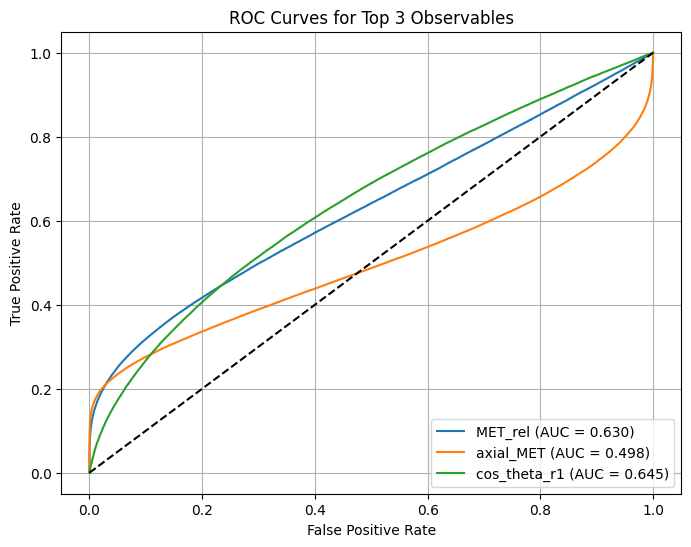

In [61]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Function to plot ROC curve and calculate AUC
def plot_roc_curves(observables, signal_data, background_data):
    plt.figure(figsize=(8, 6))
    
    for observable in observables:
        # Combine signal and background data
        combined_data = pd.concat([signal_data[observable], background_data[observable]])
        labels = [1] * len(signal_data) + [0] * len(background_data)  # 1 for signal, 0 for background

        # Compute ROC curve
        fpr, tpr, _ = roc_curve(labels, combined_data)
        roc_auc = auc(fpr, tpr)
        
        # Plot ROC curve
        plt.plot(fpr, tpr, label=f"{observable} (AUC = {roc_auc:.3f})")
    
    plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line for random chance
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curves for Top 3 Observables")
    plt.legend(loc="lower right")
    plt.grid()
    plt.show()

# Define the top 3 observables
top_observables = ["MET_rel", "axial_MET", "cos_theta_r1"]

# Generate and plot the ROC curves
plot_roc_curves(top_observables, signal_data, background_data)


In [86]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from matplotlib.backends.backend_pdf import PdfPages

def generate_individual_feature_roc(signal_data, background_data, features, pdf_filename="individual_feature_roc.pdf"):
    """
    Generate and save ROC curves for individual features in a PDF.

    Parameters:
        signal_data (DataFrame): DataFrame containing the signal data.
        background_data (DataFrame): DataFrame containing the background data.
        features (list): List of feature names to generate ROC curves for.
        pdf_filename (str): The filename for saving the ROC curves as a PDF.
    """
    # Filter features to include only those present in the data
    available_features = [feature for feature in features if feature in signal_data.columns and feature in background_data.columns]
    missing_features = set(features) - set(available_features)
    
    if missing_features:
        print(f"Skipping missing features: {missing_features}")
    
    # Save ROC curves to a PDF file
    with PdfPages(pdf_filename) as pdf:
        for feature in available_features:
            # Prepare labels (1 for signal, 0 for background)
            labels = [1] * len(signal_data) + [0] * len(background_data)
            values = list(signal_data[feature]) + list(background_data[feature])

            # Compute ROC curve and AUC
            fpr, tpr, _ = roc_curve(labels, values)
            roc_auc = auc(fpr, tpr)

            # Plot ROC curve
            plt.figure()
            plt.plot(fpr, tpr, label=f'{feature} (AUC = {roc_auc:.3f})')
            plt.plot([0, 1], [0, 1], 'k--')  # Diagonal for random guessing
            plt.xlabel("False Positive Rate")
            plt.ylabel("True Positive Rate")
            plt.title(f"ROC Curve for {feature}")
            plt.legend(loc="lower right")

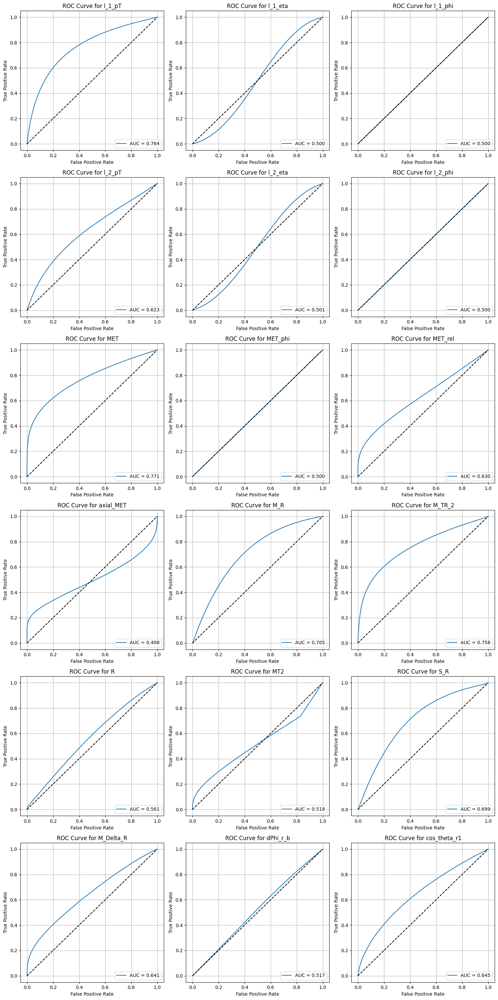

In [87]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
import math

def generate_individual_feature_roc(signal_data, background_data, features):
    """
    Generate and display ROC curves for individual features in a single output.

    Parameters:
        signal_data (DataFrame): DataFrame containing the signal data.
        background_data (DataFrame): DataFrame containing the background data.
        features (list): List of feature names to generate ROC curves for.
    """
    # Filter features to include only those present in both datasets
    available_features = [feature for feature in features if feature in signal_data.columns and feature in background_data.columns]
    missing_features = set(features) - set(available_features)
    
    if missing_features:
        print(f"Skipping missing features: {missing_features}")
    
    num_features = len(available_features)
    if num_features == 0:
        print("No valid features to plot.")
        return
    
    # Determine the number of rows and columns for subplots
    cols = 3  # Number of columns
    rows = math.ceil(num_features / cols)  # Calculate rows needed

    fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 5 * rows))
    axes = axes.flatten()  # Flatten in case of multiple rows

    for idx, feature in enumerate(available_features):
        # Prepare labels (1 for signal, 0 for background)
        labels = [1] * len(signal_data) + [0] * len(background_data)
        values = list(signal_data[feature]) + list(background_data[feature])

        # Compute ROC curve and AUC
        fpr, tpr, _ = roc_curve(labels, values)
        roc_auc = auc(fpr, tpr)

        # Plot ROC curve
        ax = axes[idx]
        ax.plot(fpr, tpr, label=f'AUC = {roc_auc:.3f}')
        ax.plot([0, 1], [0, 1], 'k--')  # Diagonal for random guessing
        ax.set_xlabel("False Positive Rate")
        ax.set_ylabel("True Positive Rate")
        ax.set_title(f"ROC Curve for {feature}")
        ax.legend(loc="lower right")
        ax.grid()

    # Hide any unused subplots
    for j in range(idx + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# Example usage:
# Assuming signal_data and background_data are your DataFrames and VarNames contains your feature names
generate_individual_feature_roc(signal_data, background_data, VarNames[1:])


Skipping ROC curve for order ['MET_rel', 'axial_MET', 'cos_theta_r1'] after cut 1 as one class is empty.


C:\Users\helix\AppData\Local\Temp\ipykernel_18232\2871753216.py:59: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc="lower right")


Skipping ROC curve for order ['axial_MET', 'cos_theta_r1', 'MET_rel'] after cut 3 as one class is empty.
Skipping ROC curve for order ['cos_theta_r1', 'MET_rel', 'axial_MET'] after cut 2 as one class is empty.


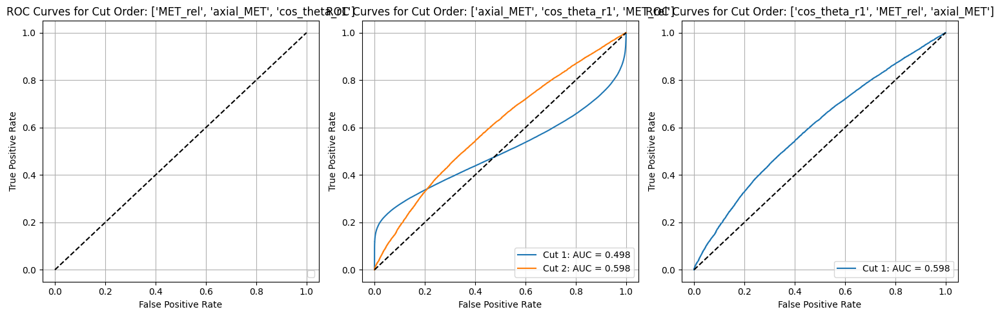

In [91]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
import math

def generate_roc_for_order_individual(signal_data, background_data, observables_orders):
    """
    Generate and display ROC curves for different orders of cuts, plotting after each cut.

    Parameters:
        signal_data (DataFrame): Signal dataset.
        background_data (DataFrame): Background dataset.
        observables_orders (list of lists): Different orders of observables to apply.
    """
    num_orders = len(observables_orders)
    cols = 3  # Number of columns for subplots
    rows = math.ceil(num_orders / cols)  # Calculate rows needed

    fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 5 * rows))
    axes = axes.flatten()  # Flatten in case of multiple rows

    for idx, order in enumerate(observables_orders):
        # Initialize signal and background data for this order
        current_signal = signal_data.copy()
        current_background = background_data.copy()
        ax = axes[idx]

        for cut_idx, observable in enumerate(order):
            params = selected_observables[observable]
            criterion = params["criterion"]
            xc = params["xc"]

            # Apply the cut based on the criterion
            if criterion == "greater":
                current_signal = current_signal[current_signal[observable] > xc]
                current_background = current_background[current_background[observable] > xc]
            elif criterion == "less":
                current_signal = current_signal[current_signal[observable] < xc]
                current_background = current_background[current_background[observable] < xc]

            # Prepare labels and values after current cut
            if len(current_signal) == 0 or len(current_background) == 0:
                print(f"Skipping ROC curve for order {order} after cut {cut_idx + 1} as one class is empty.")
                break

            labels = [1] * len(current_signal) + [0] * len(current_background)
            values = list(current_signal[observable]) + list(current_background[observable])

            # Compute ROC curve and AUC
            fpr, tpr, _ = roc_curve(labels, values)
            roc_auc = auc(fpr, tpr)

            # Plot ROC curve
            ax.plot(fpr, tpr, label=f'Cut {cut_idx + 1}: AUC = {roc_auc:.3f}')

        ax.plot([0, 1], [0, 1], 'k--')  # Diagonal for random guessing
        ax.set_xlabel("False Positive Rate")
        ax.set_ylabel("True Positive Rate")
        ax.set_title(f"ROC Curves for Cut Order: {order}")
        ax.legend(loc="lower right")
        ax.grid()

    # Hide any unused subplots
    for j in range(idx + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# Example usage:
# Assuming signal_data and background_data are your DataFrames
observables_orders = [
    ["MET_rel", "axial_MET", "cos_theta_r1"],  # Original order
    ["axial_MET", "cos_theta_r1", "MET_rel"],  # Changed order 1
    ["cos_theta_r1", "MET_rel", "axial_MET"]   # Changed order 2
]

generate_roc_for_order_individual(signal_data, background_data, observables_orders)


Empty Classes After Cuts:

Certain sequences of cuts resulted in one class (signal or background) becoming empty, preventing ROC curve generation for subsequent cuts. This occurred, for instance, in sequences starting with 'MET_rel' or involving 'axial_MET' cuts early on.
Impact of Cut Order:

The order of cuts significantly affected whether enough data remained for ROC analysis. More restrictive early cuts often led to empty classes, making AUC calculation impossible.
Legend Warning:

Some plots lacked legends due to empty datasets after particular cuts, resulting in warnings about missing labels.
These observations indicate that both the order of cuts and the thresholds used need careful adjustment to maintain sufficient data for analysis at each step.

## Exercise 8: Linear Discriminant

### Exercise 8.1

Using numpy, compute the between-class $\bf{S}_B$ and within-class $\bf{S}_W$ covariance matrices defined as:

$$
\bf{S}_B = (\bf{m_2}-\bf{m_1})(\bf{m_2}-\bf{m_1})^T \\
$$
$$
\bf{S}_W = \sum_{i=1,2} \sum_{n=1}^{l_i} (\bf{x}_n^i - \bf{m}_i) (\bf{x}_n^i - \bf{m}_i)^T
$$

where $\bf{m_i}$ are the vectors containing the means for category 1 and 2, here defined as signal and background. Here $\bf{x}_n^i$ is the vector containing the observables for the $n$th example event in category $i$.

### Exercise 8.1

Compute the linear coefficients $\bf{w} = \bf{S_W}^{-1}(\bf{m_2}-\bf{m_1})$. Compare the histogram of the distribution of $F_n^i=\bf{w}^T\bf{x}_n^i$ for the two categories.

### Exercise 8.1

Draw the ROC curve for $F_n$. 

### Exercise 8.1

What is the maximal significance you can obtain in the scenarios in exercise 5? 

In [93]:
# Calculate the means of the two classes (signal and background)
mean_signal = np.mean(signal_data.values, axis=0)
mean_background = np.mean(background_data.values, axis=0)

# Compute the between-class covariance matrix (SB)
mean_diff = (mean_background - mean_signal).reshape(-1, 1)
S_B = mean_diff @ mean_diff.T

# Compute the within-class covariance matrix (SW)
S_W = np.zeros((len(mean_signal), len(mean_signal)))

for data, mean in [(signal_data, mean_signal), (background_data, mean_background)]:
    for i in range(data.shape[0]):
        x_i = data.iloc[i].values.reshape(-1, 1)
        diff = x_i - mean.reshape(-1, 1)
        S_W += diff @ diff.T

print("Between-Class Covariance Matrix (S_B):\n", S_B)
print("\nWithin-Class Covariance Matrix (S_W):\n", S_W)


Between-Class Covariance Matrix (S_B):
 [[ 1.00000000e+00  5.36628579e-01  8.55195422e-04  8.71119155e-04
   2.57438138e-01  2.87103698e-03  6.82214057e-04  7.70479546e-01
  -1.18632905e-03  5.05258663e-01  1.59264177e-01  3.39772599e-01
   4.96726533e-01  1.03093163e-01  1.37492503e-01  3.24697188e-01
   3.43098533e-01  2.87082904e-02  1.05525694e-01]
 [ 5.36628579e-01  2.87970231e-01  4.58922304e-04  4.67467434e-04
   1.38148662e-01  1.54068049e-03  3.66095560e-04  4.13461344e-01
  -6.36618070e-04  2.71136238e-01  8.54657090e-02  1.82331687e-01
   2.66557653e-01  5.53227373e-02  7.37824064e-02  1.74241790e-01
   1.84116478e-01  1.54056891e-02  5.66281031e-02]
 [ 8.55195422e-04  4.58922304e-04  7.31359210e-07  7.44977113e-07
   2.20159917e-04  2.45529768e-06  5.83426339e-07  6.58910580e-04
  -1.01454317e-06  4.32094896e-04  1.36201995e-04  2.90571971e-04
   4.24798257e-04  8.81648006e-05  1.17582959e-04  2.77679548e-04
   2.93416294e-04  2.45511986e-05  9.02450903e-05]
 [ 8.71119155e-

The within-class covariance matrix is singular and cannot be inverted.


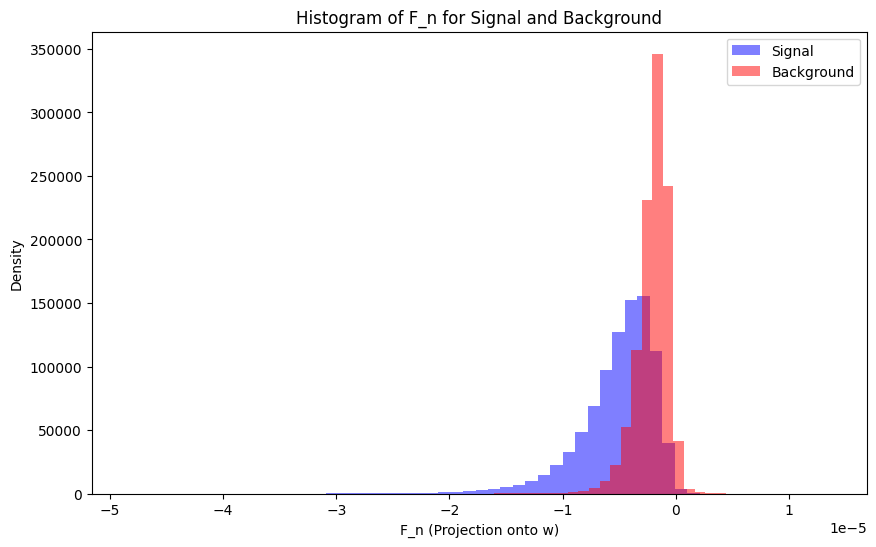

In [95]:
import numpy as np
import matplotlib.pyplot as plt

# Calculate mean vectors for signal and background classes from the data
m1 = np.mean(signal_data.values, axis=0)
m2 = np.mean(background_data.values, axis=0)

# Compute the linear coefficients w
try:
    S_W_inv = np.linalg.inv(S_W)
except np.linalg.LinAlgError:
    print("The within-class covariance matrix is singular and cannot be inverted.")
    S_W_inv = np.linalg.pinv(S_W)  # Use the pseudo-inverse if matrix is singular

w = S_W_inv @ (m2 - m1)

# Assuming 'signal_data' and 'background_data' are the datasets for the two categories
# Project the data points onto the linear discriminant vector w
F_signal = signal_data.values @ w
F_background = background_data.values @ w

# Plot the histograms of the distributions for the two categories
plt.figure(figsize=(10, 6))
plt.hist(F_signal, bins=50, alpha=0.5, label='Signal', color='b', density=True)
plt.hist(F_background, bins=50, alpha=0.5, label='Background', color='r', density=True)
plt.xlabel('F_n (Projection onto w)')
plt.ylabel('Density')
plt.title('Histogram of F_n for Signal and Background')
plt.legend(loc='upper right')
plt.show()


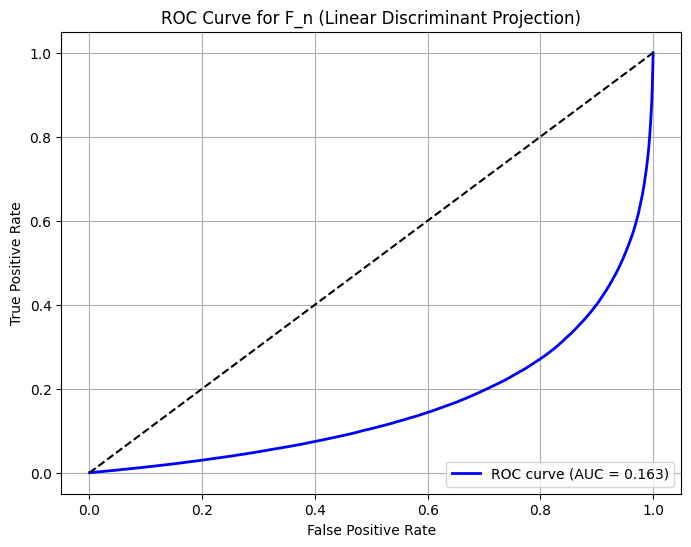

In [96]:
from sklearn.metrics import roc_curve, auc

# Combine F_signal and F_background
F_all = np.concatenate((F_signal, F_background))
labels = [1] * len(F_signal) + [0] * len(F_background)

# Calculate the ROC curve
fpr, tpr, _ = roc_curve(labels, F_all)
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='b', lw=2, label=f'ROC curve (AUC = {roc_auc:.3f})')
plt.plot([0, 1], [0, 1], color='k', linestyle='--')  # Random guessing line
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for F_n (Linear Discriminant Projection)')
plt.legend(loc='lower right')
plt.grid()
plt.show()


<>:47: SyntaxWarning: invalid escape sequence '\s'
<>:47: SyntaxWarning: invalid escape sequence '\s'
C:\Users\helix\AppData\Local\Temp\ipykernel_18232\4147453678.py:47: SyntaxWarning: invalid escape sequence '\s'
  plt.ylabel('Significance ($S/\sqrt{S+B}$)')


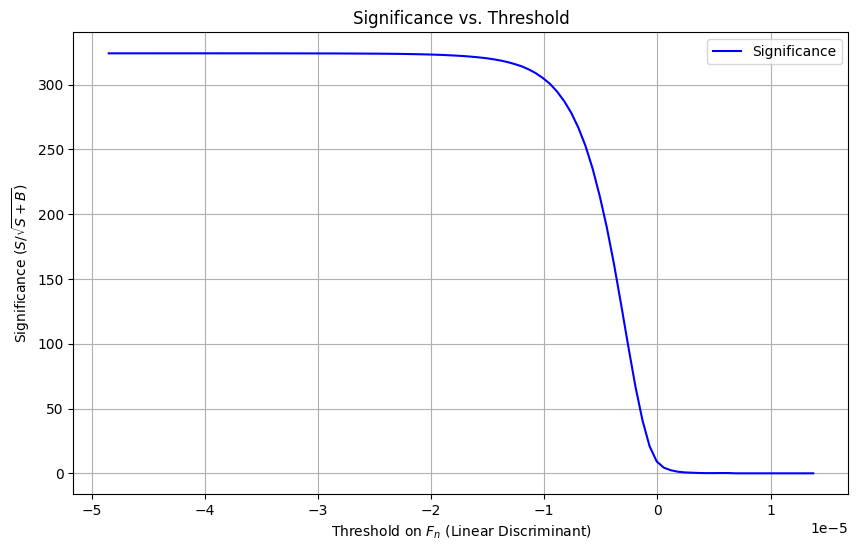

In [97]:
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate significance for different thresholds
def calculate_significance(F_signal, F_background, num_thresholds=100):
    """
    Calculate significance for different thresholds of the linear discriminant.

    Parameters:
        F_signal (ndarray): Projected values for signal events.
        F_background (ndarray): Projected values for background events.
        num_thresholds (int): Number of thresholds to consider.

    Returns:
        thresholds (ndarray): Array of threshold values.
        significances (ndarray): Array of significance values corresponding to each threshold.
    """
    min_value = min(F_signal.min(), F_background.min())
    max_value = max(F_signal.max(), F_background.max())
    thresholds = np.linspace(min_value, max_value, num_thresholds)
    significances = []

    for threshold in thresholds:
        # Count signal and background events above the threshold
        S = np.sum(F_signal > threshold)
        B = np.sum(F_background > threshold)

        # Calculate significance (handle division by zero)
        if S + B > 0:
            significance = S / np.sqrt(S + B)
        else:
            significance = 0

        significances.append(significance)

    return thresholds, np.array(significances)

# Example usage:
# Assuming F_signal and F_background are the projected values for signal and background
def plot_significance(F_signal, F_background):
    thresholds, significances = calculate_significance(F_signal, F_background)

    # Plot the significance as a function of threshold
    plt.figure(figsize=(10, 6))
    plt.plot(thresholds, significances, label='Significance', color='b')
    plt.xlabel('Threshold on $F_n$ (Linear Discriminant)')
    plt.ylabel('Significance ($S/\sqrt{S+B}$)')
    plt.title('Significance vs. Threshold')
    plt.grid()
    plt.legend()
    plt.show()

# Assuming F_signal and F_background are already calculated
plot_significance(F_signal, F_background)
